In [1]:
import os
from tokenize import group
import numpy as np
import pandas as pd
import time
from math import radians, degrees, sin, cos, asin, acos, sqrt, atan2
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable 
import plotly.figure_factory as ff
import matplotlib.collections as mcoll
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from geopy.distance import geodesic
from matplotlib.patches import PathPatch
from matplotlib.path import Path
import matplotlib.ticker as mticker
import tcmarkers
from matplotlib.font_manager import FontProperties
from mpl_toolkits.axes_grid1 import make_axes_locatable

import pickle  

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from skimage.measure import regionprops
from sklearn.decomposition import PCA

import scipy.ndimage as ndimage
from scipy.stats import gaussian_kde
from scipy.interpolate import interpn
from scipy.ndimage import binary_dilation, minimum_filter, maximum_filter, label
from scipy import integrate
from scipy.sparse import diags, kron
from scipy.sparse.linalg import spsolve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import cg

from datetime import datetime, timedelta

# import haversine
from haversine import haversine

import tropycal.tracks as tracks

from numba import jit, prange, njit

import itertools    

# from ty_pkg import latlon
from ty_pkg import truncate_colormap, colorline, setup_map, weather_map_contour, contourf_and_save, ep_t, concentric_circles, interpolate_data, set_map
from ty_pkg import latlon_extent, storm_info, haversine_distance, Met, calculate_bearing_position, tc_finder, WindFieldSolver, find_large_groups

# pangu_dir = r'/home1/jek/Pangu-Weather'
pangu_dir = r'/data03/Pangu_TC_ENS'

pres_list = ['1000','925','850','700','600','500','400','300','250','200','150','100','50']
pres_array = np.array(pres_list, dtype=np.float32)

surface_factor = ['MSLP', 'U10', 'V10', 'T2M']
surface_dict = {'MSLP':0, 'U10':1, 'V10':2, 'T2M':3}
upper_factor = ['z', 'q', 't', 'u', 'v']
upper_dict = {'z':0, 'q':1, 't':2, 'u':3, 'v':4}

proj = ccrs.PlateCarree()
norm_p = mcolors.Normalize(vmin=950, vmax=1020)

# Define the colors you want in your colormap
colors = ["purple", "darkblue", "lightblue", "white", "yellow", "red", "pink"]

# Create a colormap from the colors
pwp = LinearSegmentedColormap.from_list("custom_cmap", colors, N=256)

<div style="
  display: flex;
  justify-content: center;
  align-items: center;
  background: radial-gradient(ellipse at center, #009cd9 0%, #01263a 100%);
">
  <div style="
    text-align: center;
    color: #fff;
    font-weight: bold;
    font-size: 3.5rem;
    padding: 32px 56px;
    border-radius: 40px;
    background: rgba(0,156,217,0.75);
    box-shadow: 0 8px 32px 0 rgba(0,40,80,0.35);
    letter-spacing: 0.05em;
    text-shadow: 
      0 4px 20px #0088b8,
      0 0 30px #3df2ff,
      0 0 8px #fff;
    position: relative;
    overflow: hidden;
  ">
    <span style="font-size: 2.7rem; margin-right: 0.5em; vertical-align: middle; animation:spin 2s linear infinite;">🌀</span>
    <span style="display: inline-block; vertical-align: middle;">
      Bring <span style="color: #ffe66b; filter: drop-shadow(0 0 12px #fffbe7);">TC data</span>
    </span>
    <span style="font-size: 2.7rem; margin-left: 0.5em; vertical-align: middle; animation:spinrev 2s linear infinite;">🌀</span>
    <div style="font-size: 1.2rem; margin-top: 18px; opacity: 0.8; letter-spacing: 0.04em;">
      <span style="font-size:1.6rem;">🌬️</span> Typhoon’s track <span style="font-size:1.6rem;">🌊</span>
    </div>
  </div>
</div>
<style>
@keyframes spin {
  0% {transform: rotate(0deg);}
  100% {transform: rotate(360deg);}
}
@keyframes spinrev {
  0% {transform: rotate(360deg);}
  100% {transform: rotate(0deg);}
}
</style>


In [61]:
#! 태풍 경로 정보 기존 정보 불러오기
#위경도 지정
lat_indices, lat_start, lat_end, lon_indices, lon_start, lon_end, extent, latlon_ratio = latlon_extent(100,160,5,45)  
lon_grid, lat_grid = np.meshgrid(lon_indices[lon_start:lon_end + 1], lat_indices[lat_start:lat_end + 1])


ssv_dict = {}


#태풍 지정
storm_name, storm_year, key_time_list  = 'HINNAMNOR', 2022, ['2022/08/27/00UTC']
# storm_name, storm_year, key_time_list  = 'NORU', 2017, ['2017/07/30/00UTC']
# storm_name, storm_year, key_time_list  = 'DEBBY', 2012, ['2012/06/23/00UTC']                                                                               


if storm_name == 'DEBBY':
    lat_indices, lat_start, lat_end, lon_indices, lon_start, lon_end, extent, latlon_ratio = latlon_extent(250,310,5,45)  
    lon_grid, lat_grid = np.meshgrid(lon_indices[lon_start:lon_end + 1], lat_indices[lat_start:lat_end + 1])


surface_factors = []  # 예시: 지표면에서는 'MSLP'만 선택
upper_factors = ['z'] 
if storm_name == 'HINNAMNOR':
    perturation_scale = 0.05
else:
    perturation_scale = 0.1

#예측 시간 지정, 초기 시간 지정, 앙상블 수
predict_interval_list = np.arange(0,24*7+1,6)  
ens_list = range(0,4000)
new_ssv = 'n'           #새로 생성할 것인지 여부, n이면 기존 파일 불러옴
retro_opt = 'td'        #다시 돌아가면서 태풍 추적시 강한 것만 추적하려면 td로

if retro_opt =='td':
    retro_opt = '_td'
else:
    retro_opt = ''
        
#! 태풍 경로 정보 새로 생성하기

for first_str in key_time_list:
    first_time = datetime.strptime(first_str, "%Y/%m/%d/%HUTC")
    key_str = first_time.strftime("%m.%d.%HUTC")
    ssv_key = first_time
    surface_factors.sort()
    upper_factors.sort()
    surface_str = "".join([f"_{factor}" for factor in surface_factors])  # 각 요소 앞에 _ 추가
    upper_str = "".join([f"_{factor}" for factor in upper_factors])  # 각 요소 앞에 _ 추가
    
    datetime_list = np.array([first_time + timedelta(hours=int(hours)) for hours in predict_interval_list])
    # datetime_array = np.array([(first_time + timedelta(hours=int(hours))) for hours in predict_interval_list])
    storm_lon, storm_lat, storm_mslp, storm_time = storm_info(pangu_dir, storm_name, storm_year, datetime_list = datetime_list, wind_thres=0)   #태풍 영문명, 년도 입력

    
    # with open(rf'/data03/Pangu_TC_ENS/{perturation_scale}ENS{surface_str}{upper_str}/ssv_dict{retro_opt}_{min(ens_list)}_{max(ens_list)}.pkl', 'rb') as f:
    with open(rf'{pangu_dir}/output_data/{first_str}/{perturation_scale}ENS{surface_str}{upper_str}/ssv_dict{retro_opt}_{min(ens_list)}_{max(ens_list)}.pkl', 'rb') as f:
        ssv_dict = pickle.load(f)

@njit(parallel=True)
def compute_cov_vector(distances, S):  # distances: (N,), S: (N, M)
    N, M = S.shape
    cov_vector = np.zeros(M)
    mean_d = 0.0
    for i in range(N):
        mean_d += distances[i]
    mean_d /= N

    for j in prange(M):  # 여기만 prange!
        mean_s = 0.0
        for i in range(N):
            mean_s += S[i, j]
        mean_s /= N

        cov = 0.0
        for i in range(N):
            cov += (distances[i] - mean_d) * (S[i, j] - mean_s)
        cov_vector[j] = cov / (N - 1)
    
    return cov_vector

'''
ens_idx_list는 전체 4000개 멤버 중에서 key_time에 해당하는 멤버들에 대한 인덱스 리스트

이후에 ens_idx_list에서 group에 속하는 것들은 group_idx_all_list에 저장

group_idx_list는 ens_idx_list에서 해당하는 인덱스를 추출, ens_uv_factor_uv_all에서 group_idx_list로 인덱싱하여 ens_factor_uv를 구함
'''

if storm_name == 'HINNAMNOR':
    key_time = datetime(2022,8,27,0)             #처음 시점 지정
    start_time = datetime(2022,8,28,0)           #분석 시작 시점
    target_time = datetime(2022,9,1,0)           #위치 projection을 구하고자 하는 시간
elif storm_name == 'NORU':
    key_time = datetime(2017,7,30,0)              #처음 시점 지정
    start_time = datetime(2017,7,30,0)            #분석 시작 시점
    target_time = datetime(2017,8,4,0)            #위치 projection을 구하고자 하는 시간
elif storm_name == 'DEBBY':
    key_time = datetime(2012,6,23,0)              #처음 시점 지정
    start_time = datetime(2012,6,24,0)            #분석 시작 시점
    target_time = datetime(2012,6,27,0)            #위치 projection을 구하고자 하는 시간

key_str = key_time.strftime("%m.%d %HUTC")
start_str = start_time.strftime("%m.%d %HUTC")
target_str = target_time.strftime("%m.%d %HUTC")

total_time_range = int((target_time - key_time).total_seconds() / 3600)
start_time_range = int((start_time  - key_time).total_seconds() / 3600)

# 변수 지정
distance_threshold = 0                      #가까운 태풍의 거리
steer_pres = [850,700,600,500,400,300,250]  #steering wind 구할 때 사용하는 고도 바꿀 필요 x
axis_opt = 'quiver'                         #axis 뭘로 잡을지, opt: 위치 상관관계 최대인 axis, tar: 최종 위치의 axis, mid: 중간 위치의 axis, lon: 경도, lat: 위도
data_sign = 'y'                             #기존의 데이터를 사용할 것인지, n이면 새로 구함
min_mem_threshold = 5                       #최소 멤버 수
time_array = np.arange(start_time_range,total_time_range+1,6)  #예측 시간 범위
if storm_name == 'NORU':
    time_array = np.arange(6, 121, 6)  #Noru는 6시간 단위로만 진행

nearby_sign_name = '_nearby'
altitude = '850_200'
choosen_factor = 'steering_wind'



cov_timeline = {}


base_output_path = f'/data03/Pangu_TC_ENS/output_data/{first_str}/{perturation_scale}ENS{surface_str}{upper_str}/{start_str}_{target_str}_e{len(ens_list)}'


ens_idx_list = []
    
for ens in ens_list:
    if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
        ens_idx_list.append(ens)


# 데이터를 추출합니다
tar_pos = np.array([(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list])
#타겟 위치의 PCA
corr_pos_tar = np.array(tar_pos)
corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
pca_tar = PCA(n_components=1)
pca_tar.fit(corr_pos_tar)
pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

## Draw Best and ENS Track

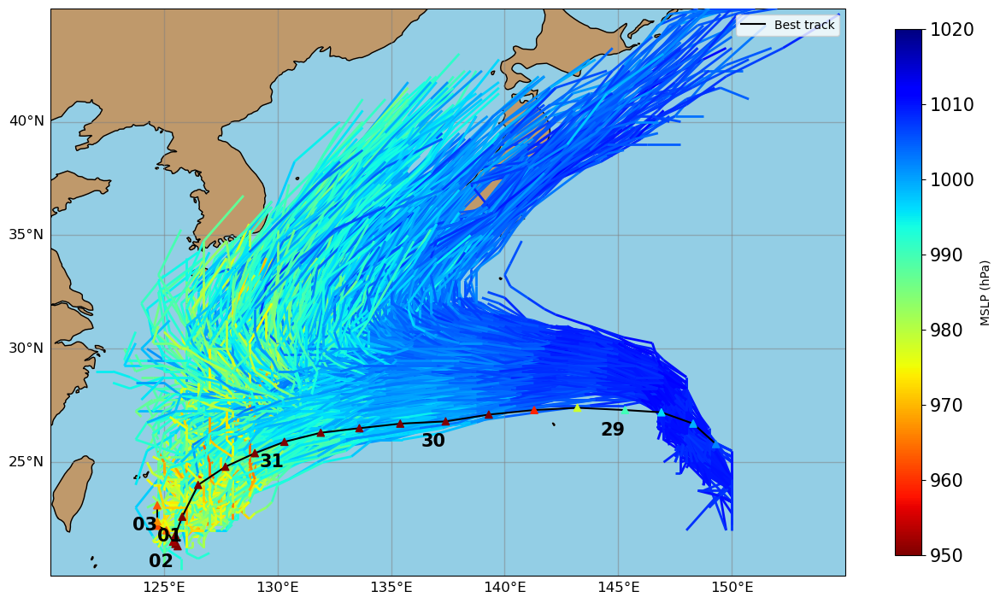

In [89]:
for key_time ,min_position in ssv_dict.items():
    fig, ax = plt.subplots(1, 1, figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
    key_str = key_time.strftime("%m.%d.%HUTC")
    # ax.set_title(f'{key_time.strftime("%Y-%m-%d-%HUTC")} (+{predict_interval_list[-1]}h)', fontsize=20, loc = 'left')
    # ax.set_title(f'ENS{surface_str}{upper_str}{perturation_scale} Track\n{storm_name}', fontsize=20, loc = 'right')
    # ax.set_title(f'{storm_name}', fontsize=20, loc = 'right')
    ax.set_extent([120,155,20,45], crs=proj)
    # ax.set_extent([255,290,20,45], crs=proj)
    setup_map(ax)

    ax.plot(storm_lon, storm_lat, color='black', linestyle='-', marker='', label = 'Best track', transform=ax.projection, zorder=10)
    model_pred_sc = ax.scatter(storm_lon, storm_lat, c=storm_mslp, cmap='jet_r', marker='^',norm=norm_p, transform=ax.projection, zorder=10)
    cbar = plt.colorbar(model_pred_sc, ax=ax, orientation='vertical', label='MSLP (hPa)', shrink=0.8)
    cbar.ax.tick_params(labelsize=15)

    
    for i in range(len(storm_time)):
        new_time = storm_time[i].strftime("%Y/%m/%d/%HUTC")
        if new_time.endswith('00UTC'):
            dx, dy = 5, -0.5  # 시간 나타낼 위치 조정
            new_lon, new_lat = storm_lon[i] + dx, storm_lat[i] + dy
            
            # annotate를 사용하여 텍스트와 함께 선(화살표)을 그림
            ax.text(storm_lon[i], new_lat, new_time[8:-6]
                    , horizontalalignment='right', verticalalignment='top', fontsize=15, zorder = 20, fontweight = 'bold')



    for ens in ens_list:  
    # for ens in ens_not_list[:10]:  


        lons = [pos['lon'] for _,pos in min_position[ens].items()]
        lats = [pos['lat'] for _,pos in min_position[ens].items()]
        min_values = [pos['mslp'] for _,pos in min_position[ens].items()]
        pred_times = [pos for pos,_ in min_position[ens].items()]
        # print(ens)
        lc = colorline(ax, lons, lats, z=min_values, cmap=plt.get_cmap('jet_r'), norm=mcolors.Normalize(vmin=950, vmax=1020), linewidth=2, alpha=1, transform=ax.projection)

        #? 시간 표시 00UTC만 표시, 없앨듯

        # if ens == 0:
        #     lc = colorline(ax, lons, lats, z=min_values, cmap=plt.get_cmap('jet_r'), norm=mcolors.Normalize(vmin=950, vmax=1020), linewidth=2, alpha=1)
        #     ax.scatter(lons, lats, c='red', linewidth=2, alpha=1, zorder=10, label = 'No perturbation')

        #     for i in range(len(pred_times)):
        #         if pred_times[i].hour == 0:
        #             ax.text(lons[i],lats[i], str(pred_times[i].day)
        #                 , horizontalalignment='center', verticalalignment='bottom', fontsize=10, zorder = 6)

        
    ax.legend(loc='upper right')


    lons_all = np.concatenate([np.array([pos['lon'] for _, pos in min_position[ens].items()]) for ens in ens_list])
    lats_all = np.concatenate([np.array([pos['lat'] for _, pos in min_position[ens].items()]) for ens in ens_list])


    xy = np.vstack([lons_all, lats_all])
    kde = gaussian_kde(xy)
    positions = np.vstack([lon_grid.ravel(), lat_grid.ravel()])
    f = np.reshape(kde(positions).T, lon_grid.shape)


    levels = np.linspace(0.0005, 0.015, 100)
    # cf = ax.contourf(lon_grid, lat_grid, f, levels=levels, transform=proj, cmap='jet')
    plt.show()
    # fig.savefig(f'{pangu_dir}/plot/Ensemble_track_{key_str}.png',bbox_inches='tight')
    

<div style="display:flex; justify-content:center; align-items:center; position:relative; padding:32px 0;">

  <!-- 왼쪽 박스 -->
  <span style="
    color: #312f3a;
    background: linear-gradient(90deg, #d3d3db 80%, #b1a0f7 100%);
    padding: 16px 36px 16px 32px;
    border-radius: 28px 0 0 28px;
    font-weight: bold;
    font-size: 2.2em;
    border-left: 5px solid #ada7c6;
    border-top: 2.5px solid #e1dbfa;
    border-bottom: 2.5px solid #e1dbfa;
    box-shadow: 2px 0 12px #b6bbc933;
    letter-spacing: 1.1px;
    text-shadow: 0 1px 5px #fff8, 0 1px 4px #8a8b9044;
    display: flex;
    align-items: center;
    height: 64px;
    z-index:1;
  ">
    Split
  </span>
  
  <!-- 가위 아이콘: 박스 경계 한가운데에 오버랩 -->
  <span style="
    position:absolute;
    left: 46.3%;
    top: 48.5%;
    transform: translate(-50%,-48%);
    font-size:2.2em;
    z-index:3;
    pointer-events:none;
    filter: drop-shadow(0 2px 8px #6e64ad70);
    " aria-hidden="true">
    ✂️
  </span>
  
  <!-- 오른쪽 박스 -->
  <span style="
    color: white;
    background: linear-gradient(90deg, #7662d8 0%, #b1a0f7 100%);
    padding: 16px 32px 16px 36px;
    border-radius: 0 28px 28px 0;
    font-weight: bold;
    font-size: 2.2em;
    border-right: 5px solid #a89cda;
    border-top: 2.5px solid #e1dbfa;
    border-bottom: 2.5px solid #e1dbfa;
    margin-left: -5px;
    box-shadow: -2px 0 12px #a799f333;
    letter-spacing: 1.1px;
    text-shadow: 0 1px 5px #fff8, 0 1px 4px #7662d899;
    display: flex;
    align-items: center;
    height: 64px;
    z-index:1;
  ">
    Sensitivity
  </span>
</div>


In [ ]:
corr_list = []

for predict_interval in time_array:
    print(f'Processing {predict_interval} hours forecast...')
    datetime1 = key_time + timedelta(hours=int(predict_interval))
    
    
    # base_output_path = f'/data03/Pangu_TC_ENS/output_data/{first_str}/{perturation_scale}ENS{surface_str}{upper_str}/{len(ens_list)}_{start_str}_{target_str}'
    ens_factor_uv_path = os.path.join(base_output_path, 'ens_factor_uv')     #Steering 고도 한번에 고려 (2529, 2, 161, 241)
    ens_factor_uv_all = np.load(f'{ens_factor_uv_path}/{predict_interval}h.npy')
    
    ens_idx_list = []

        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)
    
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]
    
    # NumPy 배열로 변환
    mid_pos, tar_pos = np.array(mid_pos), np.array(tar_pos)
    
    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])

    #distance 구하기
    corr_pos_tar = np.copy(tar_pos)
    corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)

    distances_tar = (projection - ensemble_mean) * 111
    
    #타겟 위치의 PCA
    corr_pos_mid = np.copy(mid_pos)
    corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_mid = PCA(n_components=1)
    pca_mid.fit(corr_pos_mid)
    pca_mid.mean_[0] = pca_mid.mean_[0] / np.cos(np.radians(pca_mid.mean_[1])) + np.mean(mid_pos[:, 0])
    ensemble_mean = np.mean(pca_mid.transform(corr_pos_mid)[:, 0])

    #distance 구하기
    corr_pos_mid = np.copy(mid_pos)
    corr_pos_mid[:, 0] = (mid_pos[:, 0]-np.mean(mid_pos[:, 0])) * np.cos(np.radians(mid_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_mid.transform(corr_pos_mid)[:, 0]  # 주축에 투영된 데이터 (1차원)

    distances_mid = (projection - ensemble_mean) * 111

    corr_list.append(np.abs(np.corrcoef(distances_mid, distances_tar)[0, 1]))


plt.figure(figsize=(10, 6))
plt.ylim(0,1.1)
plt.plot(time_array, corr_list, marker='o', linestyle='-', color='b')
plt.title(f'Correlation between Mid and Target Positions for {storm_name} ({key_str})')
plt.xlabel('Forecast Time (hours)')
plt.ylabel('Correlation Coefficient')
plt.grid()

24h 총 개수:100, 누적 개수:73, 현재 그룹 개수:73
24h 총 개수:100, 누적 개수:84, 현재 그룹 개수:11
24h 총 개수:100, 누적 개수:89, 현재 그룹 개수:5
No more groups with at least 5 members found.


/tmp/ipykernel_1967709/692156829.py:198: RuntimeWarning: Mean of empty slice
  cov_all_inner[uv_key] = np.nanmean(masked_cov)


pw:  nan, gw:  nan, total: nan, mi:  nan, di:  nan


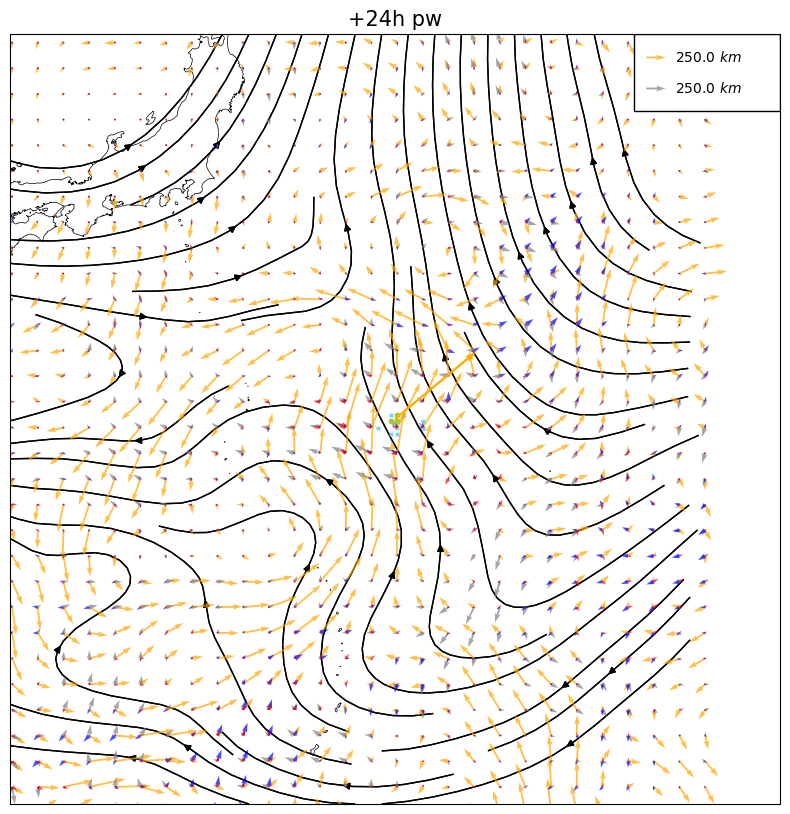

48h 총 개수:100, 누적 개수:28, 현재 그룹 개수:28
48h 총 개수:100, 누적 개수:54, 현재 그룹 개수:26
48h 총 개수:100, 누적 개수:72, 현재 그룹 개수:18
48h 총 개수:100, 누적 개수:82, 현재 그룹 개수:10
48h 총 개수:100, 누적 개수:87, 현재 그룹 개수:5
No more groups with at least 5 members found.


/tmp/ipykernel_1967709/692156829.py:198: RuntimeWarning: Mean of empty slice
  cov_all_inner[uv_key] = np.nanmean(masked_cov)


pw:  nan, gw:  nan, total: nan, mi:  nan, di:  nan


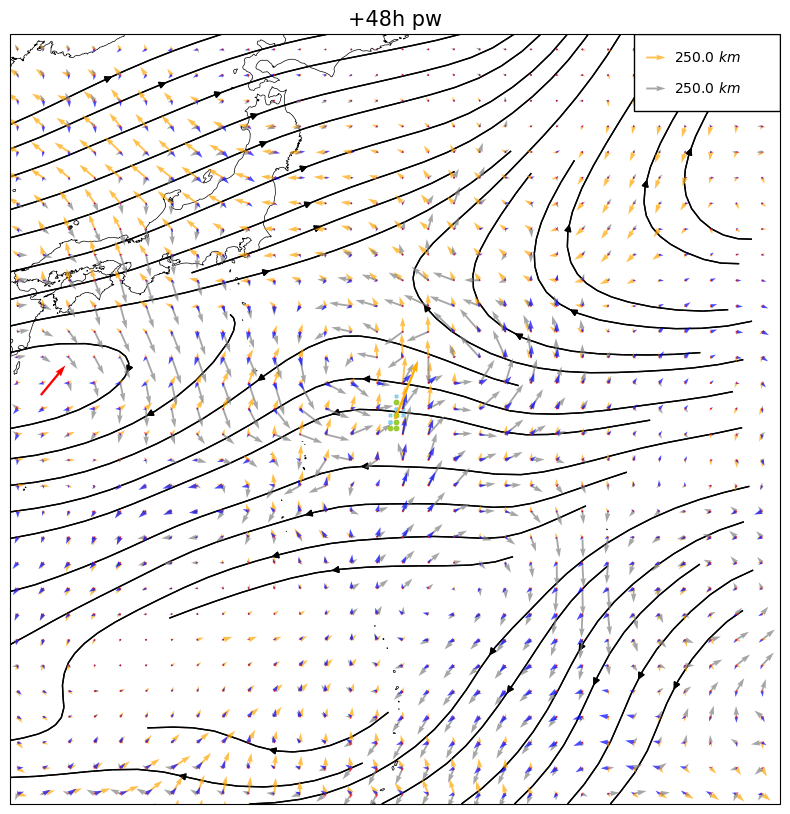

72h 총 개수:100, 누적 개수:10, 현재 그룹 개수:10
72h 총 개수:100, 누적 개수:17, 현재 그룹 개수:7
72h 총 개수:100, 누적 개수:22, 현재 그룹 개수:5
72h 총 개수:100, 누적 개수:27, 현재 그룹 개수:5
No more groups with at least 5 members found.


/tmp/ipykernel_1967709/692156829.py:198: RuntimeWarning: Mean of empty slice
  cov_all_inner[uv_key] = np.nanmean(masked_cov)


pw:  nan, gw:  nan, total: nan, mi:  nan, di:  nan


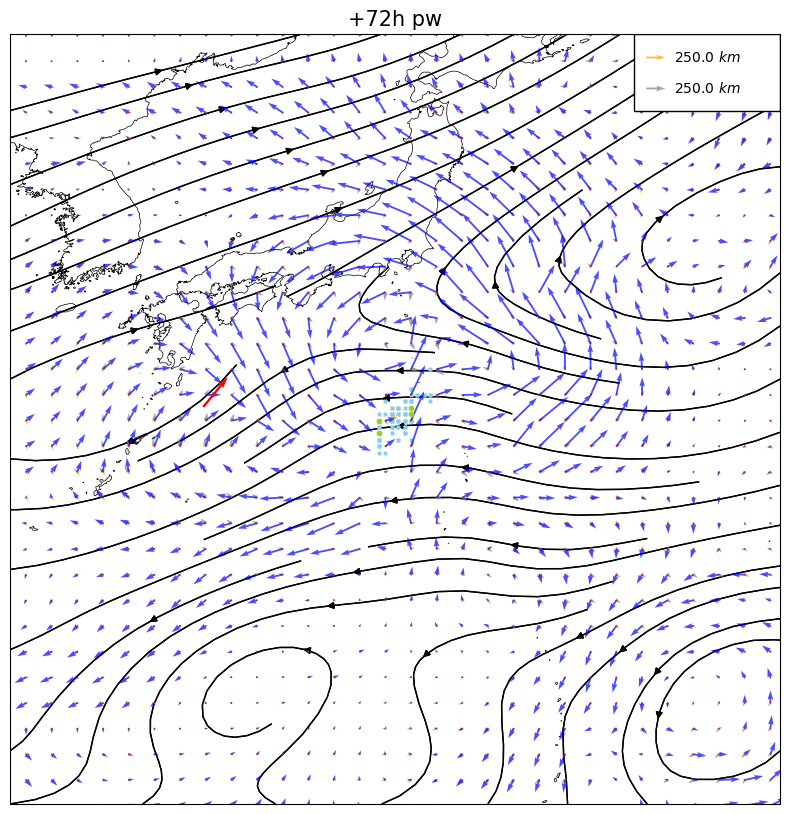

No more groups with at least 5 members found.


/tmp/ipykernel_1967709/692156829.py:130: RuntimeWarning: Degrees of freedom <= 0 for slice.
  S_pw_var_mean    = np.array([np.nanvar(u_pw_mean, axis=0), np.nanvar(v_pw_mean, axis=0)])
/tmp/ipykernel_1967709/692156829.py:131: RuntimeWarning: Mean of empty slice
  S_pw_mean_var    = np.array([np.nanmean(u_pw_var, axis=0), np.nanmean(v_pw_var, axis=0)])
/tmp/ipykernel_1967709/692156829.py:133: RuntimeWarning: Mean of empty slice
  S_total_mean     = np.array([np.nanmean(u_total, axis=0), np.nanmean(v_total, axis=0)])
/tmp/ipykernel_1967709/692156829.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice.
  S_total_var      = np.array([np.nanvar(u_total, axis=0), np.nanvar(v_total, axis=0)])
/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home1/jek/miniconda3/envs/pangu/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid valu

IndexError: arrays used as indices must be of integer (or boolean) type

In [64]:
variance_opt = 'y'

for predict_interval in time_array[::4]:
# for predict_interval in [120]:
    datetime1 = key_time + timedelta(hours=int(predict_interval))

    group_num=0
    group_mem=0
    group_num_list = []
    group_idx_list = []
    u_pw_mean, u_pw_var, u_total = [], [], []
    v_pw_mean, v_pw_var, v_total = [], [], []
    j_pw, j_total = [], []
    cov_pw = {'u':[], 'v':[]}
    cov_pw_each = {'u':[], 'v':[]}
    cov_pw_inner = {'u':[], 'v':[]}
    cov_gw = {'u':[], 'v':[]}
    cov_gw_inner = {'u':[], 'v':[]}
    cov_pw1, cov_pw2, cov_gw1, cov_gw2 = {'u':[], 'v':[]}, {'u':[], 'v':[]}, {'u':[], 'v':[]}, {'u':[], 'v':[]}
    cov_total = {'u':[], 'v':[]}
    cov_total_inner = {'u':[], 'v':[]}
    cov_all = {'u':[], 'v':[]}
    cov_all_inner = {'u':[], 'v':[]}
    cov_minor = {'u':[], 'v':[]}
    cov_minor_inner = {'u':[], 'v':[]}
    cov_diff = {'u':[], 'v':[]}
    scale = 20000

    ens_factor_uv=[]
    total_remove_uv = []
    u_mean_each = []
    v_mean_each = []
    dis_from_point = []
    
    
    # base_output_path = f'/data03/Pangu_TC_ENS/output_data/{first_str}/{perturation_scale}ENS{surface_str}{upper_str}/{len(ens_list)}_{start_str}_{target_str}'
    ens_factor_uv_path = os.path.join(base_output_path, 'ens_factor_uv')     #Steering 고도 한번에 고려 (2529, 2, 161, 241)
    ens_factor_uv_all = np.load(f'{ens_factor_uv_path}/{predict_interval}h.npy')
    
    ens_idx_list = []

        
    for ens in ens_list:
        if (target_time in ssv_dict[key_time][ens]) and (start_time in ssv_dict[key_time][ens]):
            ens_idx_list.append(ens)

        if len(ens_idx_list) >= 100:
            break
    
    
    
    # 데이터를 추출합니다
    mid_pos = [(ssv_dict[key_time][ens][datetime1]['lon'], ssv_dict[key_time][ens][datetime1]['lat']) for ens in ens_idx_list]
    tar_pos = [(ssv_dict[key_time][ens][target_time]['lon'], ssv_dict[key_time][ens][target_time]['lat']) for ens in ens_idx_list]
    
    # NumPy 배열로 변환
    mid_pos_all, tar_pos_all = np.array(mid_pos), np.array(tar_pos)
    mean_mid_pos = np.mean(mid_pos_all, axis=0)
    mid_pos_group = []
    
    #타겟 위치의 PCA
    corr_pos_tar = np.copy(tar_pos_all)
    corr_pos_tar[:, 0] = (tar_pos_all[:, 0]-np.mean(tar_pos_all[:, 0])) * np.cos(np.radians(tar_pos_all[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    pca_tar = PCA(n_components=1)
    pca_tar.fit(corr_pos_tar)
    pca_tar.mean_[0] = pca_tar.mean_[0] / np.cos(np.radians(pca_tar.mean_[1])) + np.mean(tar_pos_all[:, 0])
    ensemble_mean = np.mean(pca_tar.transform(corr_pos_tar)[:, 0])


    while True:     # 더 이상 20개 미만의 멤버가 남지 않을 때까지 반복
        t0 = time.time()
        point_wise_result = find_large_groups(mid_pos_all, ens_idx_list, tar_pos_all, 'y', distance_threshold, group_num+1, min_mem_threshold)
        t1 = time.time()

        # 하나의 포인트 안에 있는 멤버 수가 20개 이상인 경우
        if not point_wise_result:
            print(f"No more groups with at least {min_mem_threshold} members found.")
            break

        tar_pos, mid_pos, group_idx, group_all_idx = point_wise_result
        group_mem+=len(group_idx)
        group_num+=1
        mid_pos_group.append(mid_pos[0])
        dis_from_point.append(haversine_distance(lat_grid, lon_grid, np.ones_like(lat_grid)*mid_pos[0,1], np.ones_like(lat_grid)*mid_pos[0,0]))
        print(f'{predict_interval}h', f'총 개수:{len(ens_idx_list)}, 누적 개수:{group_mem}, 현재 그룹 개수:{len(group_idx)}')
        group_num_list.append(len(group_idx))
        group_idx_list.extend(group_all_idx)

        #distance 구하기
        corr_pos_tar = np.copy(tar_pos)
        corr_pos_tar[:, 0] = (tar_pos[:, 0]-np.mean(tar_pos_all[:, 0])) * np.cos(np.radians(tar_pos[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
        projection = pca_tar.transform(corr_pos_tar)[:, 0]  # 주축에 투영된 데이터 (1차원)

        # 각 앙상블 멤버의 투영 데이터와 ensemble mean 사이의 거리 계산
        distances = (projection - ensemble_mean) * 111
        
        # # 각 앙상블 멤버의 거리를 저장
        # ensemble_distances = {ens: distance for ens, distance in enumerate(distances)}

        ens_factor_uv = ens_factor_uv_all[group_idx]            #ens_factor_uv_all에는 생존한 멤버들만 존재해서 group_idx로 인덱싱 가능
        u_pw_mean.append(np.mean(ens_factor_uv[:,0,:,:], axis = 0))
        v_pw_mean.append(np.mean(ens_factor_uv[:,1,:,:], axis = 0))
        u_pw_var.append(np.nanvar(ens_factor_uv[:,0,:,:], axis = 0))
        v_pw_var.append(np.nanvar(ens_factor_uv[:,1,:,:], axis = 0))
        j_pw.append(np.mean(distances, axis = 0))
        u_total.extend(ens_factor_uv[:,0,:,:])
        v_total.extend(ens_factor_uv[:,1,:,:])
        j_total.extend(distances)
        ens_factor = np.copy(np.array(ens_factor_uv))

        ens_factor_quiver = (ens_factor[:,0,:,:], ens_factor[:,1,:,:])
        
        t2 = time.time()
        for UV, uv_key in zip(ens_factor_quiver,['u','v']):

            # 공분산 및 분산 계산
            cov_matrix = np.zeros_like(UV[0])

            S = UV.reshape(UV.shape[0], -1)  # (samples, lat*lon)
            cov_vector = compute_cov_vector(distances, S)
            cov_matrix = cov_vector.reshape(UV.shape[1], UV.shape[2])
            
            cov_pw_each[uv_key].append(np.nan_to_num(cov_matrix))
        
        t3 = time.time()
        # print(f"Find point group: {t1 - t0:.2f}s, Load data time: {t2 - t1:.2f}s, Covariance calculation time: {t3 - t2:.2f}s")
    
    #! var related code needs to be modification, it has serious error
    S_pw_mean        = np.array([u_pw_mean, v_pw_mean])
    S_pw_var_mean    = np.array([np.nanvar(u_pw_mean, axis=0), np.nanvar(v_pw_mean, axis=0)])
    S_pw_mean_var    = np.array([np.nanmean(u_pw_var, axis=0), np.nanmean(v_pw_var, axis=0)])
    S_total          = np.array([u_total, v_total])
    S_total_mean     = np.array([np.nanmean(u_total, axis=0), np.nanmean(v_total, axis=0)])
    S_all            = np.array([ens_factor_uv_all[:,0,:,:],ens_factor_uv_all[:,0,:,:]])
    S_total_var      = np.array([np.nanvar(u_total, axis=0), np.nanvar(v_total, axis=0)])
    S_all_var        = np.array([np.nanvar(ens_factor_uv_all[:,0,:,:], axis=0), np.nanvar(ens_factor_uv_all[:,1,:,:], axis=0)])
    
    j_pw             = np.array(j_pw)
    j_total          = np.array(j_total)
    
    mid_pos_group    = np.array(mid_pos_group)
    dis_from_point   = np.array(dis_from_point)
    group_num_list   = np.array(group_num_list)
    group_idx_list   = np.array(group_idx_list)
    group_portion    = group_num_list / np.sum(group_num_list)  # 각 그룹의 비율
    minor_idx_list   = np.array(list(set(ens_idx_list) - set(group_idx_list)))
    minor_idx_ens_idx_list = np.array([ens_idx_list.index(x) for x in minor_idx_list])
    major_idx_ens_idx_list = np.array([ens_idx_list.index(x) for x in group_idx_list])


    group_portion_extend = group_portion[:, None, None]
    j_pw_extend = (j_pw - np.mean(j_total))[:, None, None]

    major_portion = len(major_idx_ens_idx_list) / len(ens_idx_list)
    minor_portion = len(minor_idx_ens_idx_list) / len(ens_idx_list)
    diff_portion = len(major_idx_ens_idx_list) * len(minor_idx_ens_idx_list) / len(ens_idx_list)**2

    
    #! Major & Minor & All distance
    corr_pos_tar_all = np.copy(tar_pos_all)
    corr_pos_tar_all[:, 0] = (tar_pos_all[:, 0]-np.mean(tar_pos_all[:, 0])) * np.cos(np.radians(tar_pos_all[:, 1]))  # 경도에 cos(위도)를 곱해 거리 왜곡 보정
    projection = pca_tar.transform(corr_pos_tar_all)[:, 0]  # 주축에 투영된 데이터 (1차원)
    distances_all = (projection - ensemble_mean) * 111
    distances_major = distances_all[major_idx_ens_idx_list]
    distances_minor = distances_all[minor_idx_ens_idx_list]


    #! CaLculate distance from all points
    mid_lat = mid_pos_all[:, 1][:, None, None]  # (N, 1, 1)
    mid_lon = mid_pos_all[:, 0][:, None, None]  # (N, 1, 1)

    # N개 중심에 대해 모든 그리드와의 거리 한 번에 계산
    dis_from_all = haversine_distance(
        lat_grid[None, :, :],  # (1, M, K)
        lon_grid[None, :, :],  # (1, M, K)
        mid_lat,               # (N, 1, 1)
        mid_lon                # (N, 1, 1)
    )  # (N, M, K)

    # 각 중심별(=N개) 마스크
    mask_all = (dis_from_all <= 333)  # (N, M, K)
    mask_major = mask_all[major_idx_ens_idx_list]  # (N_major, M, K)
    mask_minor = mask_all[minor_idx_ens_idx_list]  # (N_minor, M, K)

        

    for i, uv_key in enumerate(['u', 'v']):
        S = ens_factor_uv_all[:,i,:,:].reshape(ens_factor_uv_all.shape[0], -1)  # (samples, lat*lon)
        cov_vector = compute_cov_vector(distances_all, S)
        cov_matrix = cov_vector.reshape(ens_factor_uv_all.shape[2], ens_factor_uv_all.shape[3])
        if variance_opt == 'y':
            cov_all[uv_key] = np.array(cov_matrix / S_all_var[i])
        else:
            cov_all[uv_key] = np.array(cov_matrix)
        masked_cov = np.where(mask_major, cov_all[uv_key][None, :, :], np.nan)  # (N, M, K)

        # 중심별(=N개)로 평균
        cov_all_inner[uv_key] = np.nanmean(masked_cov)

    #! Point-wise sensitivity & Global-wise sensitivity
    for i, (S_var, S_mean, uv_key) in enumerate(zip(S_all_var, S_total_mean, ['u','v'])):
        if variance_opt == 'y':
            cov_matrix = np.sum(group_portion_extend * (S_pw_mean[i] - S_mean) * (j_pw_extend - np.mean(j_total)), axis = 0)
            cov_gw[uv_key]  = np.nan_to_num(cov_matrix) / S_var * major_portion
            cov_pw[uv_key]  = np.sum(cov_pw_each[uv_key] * group_portion_extend, axis=0) / S_var * major_portion

            cov_pw_inner[uv_key] = np.sum([
                np.nanmean(np.where(dis_from_point[j] <= 333, cov_pw_each[uv_key][j] * group_portion_extend, np.nan)/ S_var)
                for j in range(len(cov_pw_each[uv_key]))
            ]) * major_portion
        else:
            cov_gw[uv_key]  = np.nan_to_num(cov_matrix)  * major_portion
            cov_pw[uv_key]  = np.sum(cov_pw_each[uv_key] * group_portion_extend, axis=0) * major_portion
            cov_pw_inner[uv_key] = np.sum([
                np.nanmean(np.where(dis_from_point[j] <= 333, cov_pw_each[uv_key][j] * group_portion_extend, np.nan))
                for j in range(len(cov_pw_each[uv_key]))
            ]) * major_portion

        masked_cov = np.where(mask_major, cov_gw[uv_key][None, :, :], np.nan)  # (N, M, K)
        cov_gw_inner[uv_key] = np.nanmean(masked_cov)  # 중심별(=N개)로 평균

    for UV, S_var, uv_key in zip(S_total, S_all_var, ['u', 'v']):
        S = UV.reshape(UV.shape[0], -1)
        cov_vector = compute_cov_vector(j_total, S)
        cov_matrix = cov_vector.reshape(UV.shape[1], UV.shape[2])
        if variance_opt == 'y':
            cov_total[uv_key] = np.array(cov_matrix / S_var) * major_portion
        else:
            cov_total[uv_key] = np.array(cov_matrix) * major_portion
        
        # cov_all[uv_key]: (M, K) → (1, M, K)로 브로드캐스팅
        masked_cov = np.where(mask_major, cov_total[uv_key][None, :, :], np.nan)  # (N, M, K)
        cov_total_inner[uv_key] = np.nanmean(masked_cov)

    
    for i, uv_key in enumerate(['u', 'v']):
        S = ens_factor_uv_all[minor_idx_ens_idx_list, i,:,:].reshape(len(minor_idx_ens_idx_list), -1)
        cov_vector = compute_cov_vector(distances_minor, S)
        cov_matrix = cov_vector.reshape(ens_factor_uv_all.shape[2], ens_factor_uv_all.shape[3])
        if variance_opt == 'y':
            cov_minor[uv_key] = np.array(cov_matrix / S_all_var[i]) * minor_portion
            cov_diff[uv_key] = (np.mean(ens_factor_uv_all[major_idx_ens_idx_list, i,:,:], axis = 0) - np.mean(ens_factor_uv_all[minor_idx_ens_idx_list, i,:,:], axis = 0))*(np.mean(distances_major) - np.mean(distances_minor)) / S_all_var[i] * diff_portion
        else:
            cov_minor[uv_key] = np.array(cov_matrix) * minor_portion
            cov_diff[uv_key] = (np.mean(ens_factor_uv_all[major_idx_ens_idx_list, i,:,:], axis = 0) - np.mean(ens_factor_uv_all[minor_idx_ens_idx_list, i,:,:], axis = 0))*(np.mean(distances_major) - np.mean(distances_minor)) * diff_portion
        masked_cov = np.where(mask_minor, cov_minor[uv_key][None, :, :], np.nan)  # (N, M, K)
        cov_minor_inner[uv_key] = np.nanmean(masked_cov)



    cov_timeline[predict_interval] = {  'pw': cov_pw, 'gw': cov_gw      , 'total': cov_total
                                      , 'pw_inner': cov_pw_inner        , 'total_inner': cov_total_inner    , 'gw_inner':cov_gw_inner           , 'all': cov_all                    , 'all_inner': cov_all_inner
                                      , 'minor': cov_minor              , 'minor_inner': cov_minor_inner    , 'diff': cov_diff
                                      , 'S_pw_mean': S_pw_mean          , 'S_total': S_total                , 'S_pw_var_mean': S_pw_var_mean    , 'S_pw_mean_var': S_pw_mean_var
                                      , 'u_mean': np.mean(ens_factor_uv_all[:,0,:,:], axis = 0)             , 'v_mean': np.mean(ens_factor_uv_all[:,1,:,:], axis = 0)
                                      , 'mid_pos_group': mid_pos_group  , 'mid_pos_all': mid_pos_all        , 'dis_from_point': dis_from_point  , 'group_idx_list': group_idx_list  , 'minor_idx_list': minor_idx_list
                                      , 'major_portion': major_portion  , 'minor_portion': minor_portion    , 'diff_portion': diff_portion}
    
    scale = 10000
    quiver_step = 4

    pw_size = np.mean(np.sqrt(cov_pw['u']**2 + cov_pw['v']**2)) 
    gw_size = np.mean(np.sqrt(cov_gw['u']**2 + cov_gw['v']**2)) 
    total_size = np.mean(np.sqrt(cov_total['u']**2 + cov_total['v']**2)) 
    minor_size = np.mean(np.sqrt(cov_minor['u']**2 + cov_minor['v']**2)) 
    diff_size = np.mean(np.sqrt(cov_diff['u']**2 + cov_diff['v']**2))
    all_size = np.mean(np.sqrt(cov_all['u']**2 + cov_all['v']**2))


    print(f'pw:  {pw_size/all_size:.2f}, gw:  {gw_size/all_size:.2f}, total: {total_size/all_size:.2f}, mi:  {minor_size/all_size:.2f}, di:  {diff_size/all_size:.2f}')
    mask = np.sqrt(np.mean(u_total, axis = 0)**2 + np.mean(v_total, axis = 0)**2) > 0.5
    U_masked = np.where(mask, np.mean(u_total, axis = 0), np.nan)
    V_masked = np.where(mask, np.mean(v_total, axis = 0), np.nan)

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj})
    ax.set_title(f'+{predict_interval}h pw', fontsize=15)
    ax.scatter(mid_pos_group[:,0], mid_pos_group[:,1], s=10, color='yellowgreen', transform=proj, zorder=2)
    ax.scatter(mid_pos_all[:,0], mid_pos_all[:,1], s=5, color='skyblue', transform=proj, zorder=1, marker = 'x')
    ax.set_extent([np.mean(mid_pos_group[:,0])-15,np.mean(mid_pos_group[:,0])+15,np.mean(mid_pos_group[:,1])-15,np.mean(mid_pos_group[:,1])+15], crs=proj)
    ax.coastlines(resolution='10m', linewidth=0.5, zorder = 0)
    ax.streamplot(lon_grid, lat_grid, U_masked, V_masked, density=1, linewidth=1, color='black', minlength=0.3, zorder = 0)
    
    qui_pw = ax.quiver(lon_grid[::quiver_step,::quiver_step], lat_grid[::quiver_step,::quiver_step], cov_pw['u'][::quiver_step,::quiver_step], cov_pw['v'][::quiver_step,::quiver_step], color='orange', scale = scale, alpha = 0.7)
    key_pw = ax.quiverkey(qui_pw, 0.85, 0.97, scale/40, f'${scale/40}\\ km$', labelpos='E', coordinates='axes', color='orange')

    qui_gw = ax.quiver(lon_grid[::quiver_step,::quiver_step], lat_grid[::quiver_step,::quiver_step], cov_gw['u'][::quiver_step,::quiver_step], cov_gw['v'][::quiver_step,::quiver_step], color='gray', scale = scale, alpha = 0.7)
    key_gw = ax.quiverkey(qui_gw, 0.85, 0.93, scale/40, f'${scale/40}\\ km$', labelpos='E', coordinates='axes', color='gray')


    qui_mi = ax.quiver(lon_grid[::quiver_step,::quiver_step], lat_grid[::quiver_step,::quiver_step], cov_minor['u'][::quiver_step,::quiver_step], cov_minor['v'][::quiver_step,::quiver_step], color='blue', scale = scale, alpha = 0.7)
    qui_diff = ax.quiver(lon_grid[::quiver_step,::quiver_step], lat_grid[::quiver_step,::quiver_step], cov_diff['u'][::quiver_step,::quiver_step], cov_diff['v'][::quiver_step,::quiver_step], color='red', scale = scale, alpha = 0.7)
    # qui_total_inner = ax.quiver(mean_mid_pos[0], mean_mid_pos[1], cov_total_inner['u'], cov_total_inner['v'], color='yellow', scale = scale, alpha = 0.7)
    ax.quiver(pca_tar.mean_[0], pca_tar.mean_[1], pca_tar.components_[0, 0], pca_tar.components_[0, 1]  , scale=20, color='r', width=0.003, label='Principal Axis', zorder = 2)
    ax.streamplot(lon_grid, lat_grid, U_masked, V_masked, density=1, linewidth=1, color='black', minlength=0.3, zorder = 0)

    qui_pw_inner = ax.quiver(np.mean(mid_pos_group[:,0]), np.mean(mid_pos_group[:,1]), cov_pw_inner['u'], cov_pw_inner['v'], color= "#ffae00", scale = scale / 5, width=0.003, zorder = 12)
    qui_all_inner = ax.quiver(np.mean(mid_pos_group[:,0]), np.mean(mid_pos_group[:,1]), cov_all_inner['u'], cov_all_inner['v'], color="#807258", scale = scale / 5, width=0.003, zorder = 12)

    rect = patches.Rectangle((0.81, 0.9), 0.19, 0.1, linewidth=1, edgecolor='black', facecolor='white', transform=ax.transAxes)
    ax.add_patch(rect)
    plt.show()
    

    
    del v_pw_mean
    del u_pw_var
    del v_pw_var
    del j_pw
    del u_total
    del v_total
    del j_total
    del mid_pos_group
    del dis_from_point
    del group_num_list
    del group_idx_list
    del ens_factor_uv_all

#! Save the results to a file
# if variance_opt == 'y':
#     pickle.dump(cov_timeline, open(f'{base_output_path}/cov_timeline_{storm_name}.pkl', 'wb'))
# else:
#     pickle.dump(cov_timeline, open(f'{base_output_path}/cov_timeline_{storm_name}_no_var.pkl', 'wb'))

In [150]:
S_all_var[0]

array([[0.19654944, 0.19956575, 0.20236928, ..., 0.22634486, 0.21922934,
        0.21423779],
       [0.16346869, 0.15674676, 0.1526592 , ..., 0.23100327, 0.22592185,
        0.21559749],
       [0.18837535, 0.17617274, 0.16503836, ..., 0.23341123, 0.22931612,
        0.22068602],
       ...,
       [0.08931594, 0.0878715 , 0.08643312, ..., 0.07193355, 0.07393529,
        0.07861749],
       [0.0858841 , 0.08603593, 0.08621269, ..., 0.07507884, 0.07689204,
        0.08113046],
       [0.08160879, 0.08271356, 0.08376453, ..., 0.07788699, 0.07972655,
        0.08246876]])

In [94]:
cov_timeline[predict_interval]['gw_inner']

{'u': 35.881473526455835, 'v': -22.2639800991792}

120h 총 개수:2529, 누적 개수:37, 현재 그룹 개수:37
120h 총 개수:2529, 누적 개수:74, 현재 그룹 개수:37
120h 총 개수:2529, 누적 개수:109, 현재 그룹 개수:35
120h 총 개수:2529, 누적 개수:139, 현재 그룹 개수:30
120h 총 개수:2529, 누적 개수:168, 현재 그룹 개수:29
120h 총 개수:2529, 누적 개수:194, 현재 그룹 개수:26
120h 총 개수:2529, 누적 개수:217, 현재 그룹 개수:23
120h 총 개수:2529, 누적 개수:240, 현재 그룹 개수:23
120h 총 개수:2529, 누적 개수:263, 현재 그룹 개수:23
120h 총 개수:2529, 누적 개수:286, 현재 그룹 개수:23
120h 총 개수:2529, 누적 개수:308, 현재 그룹 개수:22
120h 총 개수:2529, 누적 개수:329, 현재 그룹 개수:21
120h 총 개수:2529, 누적 개수:350, 현재 그룹 개수:21
No more groups with at least 20 members found.
pw:  0.00, gw:  0.08, total: 0.08, mi:  0.93, di:  0.00

## <span style="color: white; background-color:rgb(194, 160, 99); padding:5px 20px; border-radius: 20px; font-weight:bold; font-size: 30pt"> Draw Sensitivity component figure</span>

5000
+24h All


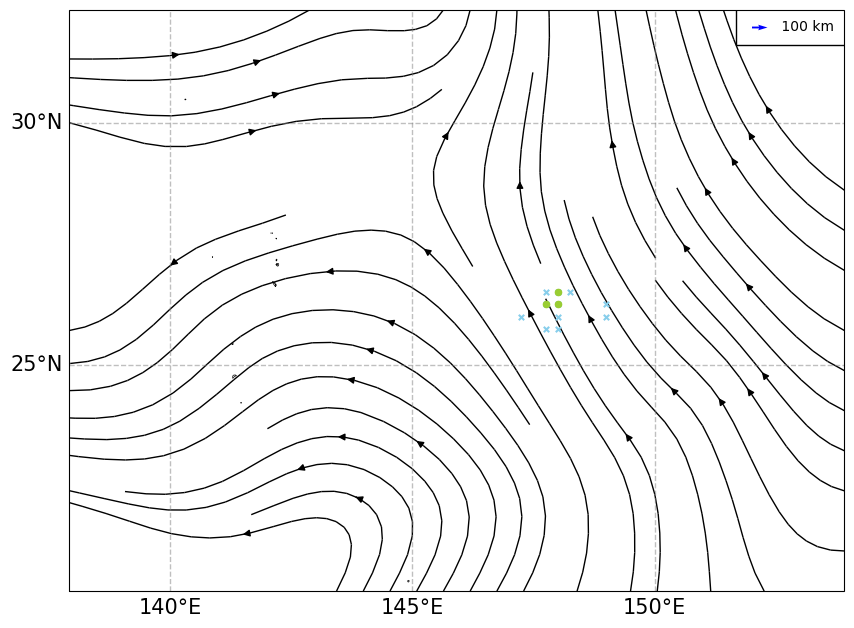

+24h PW


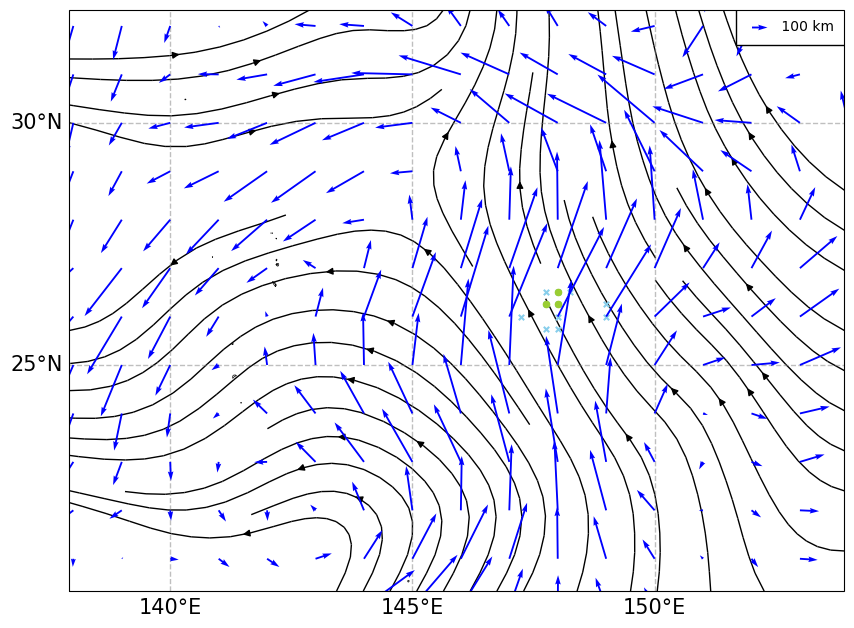

+24h CP


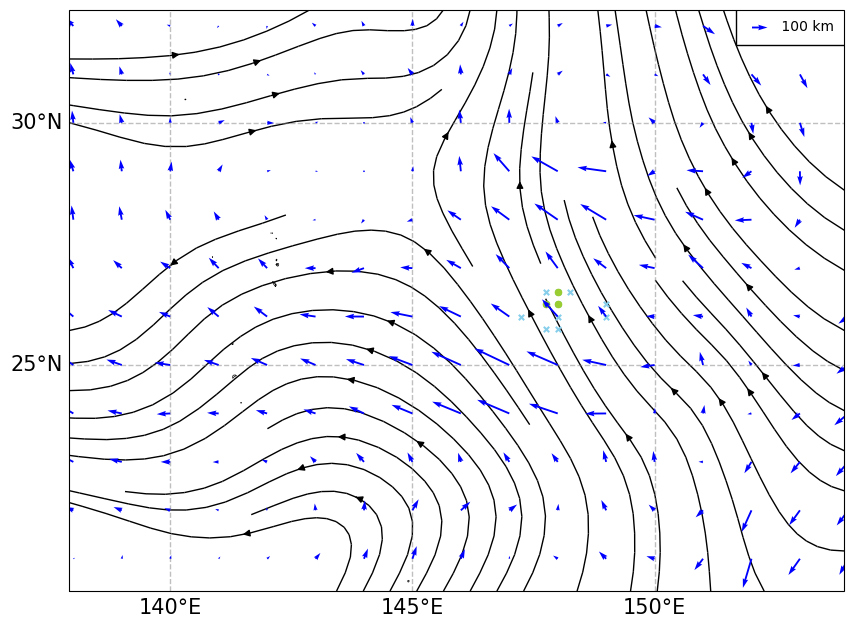

+24h Minor


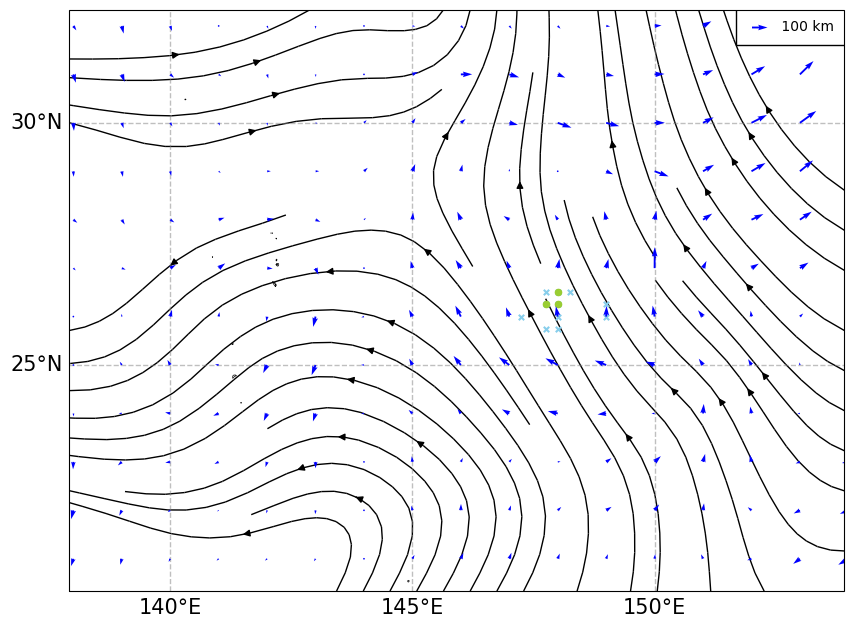

5000
+48h All


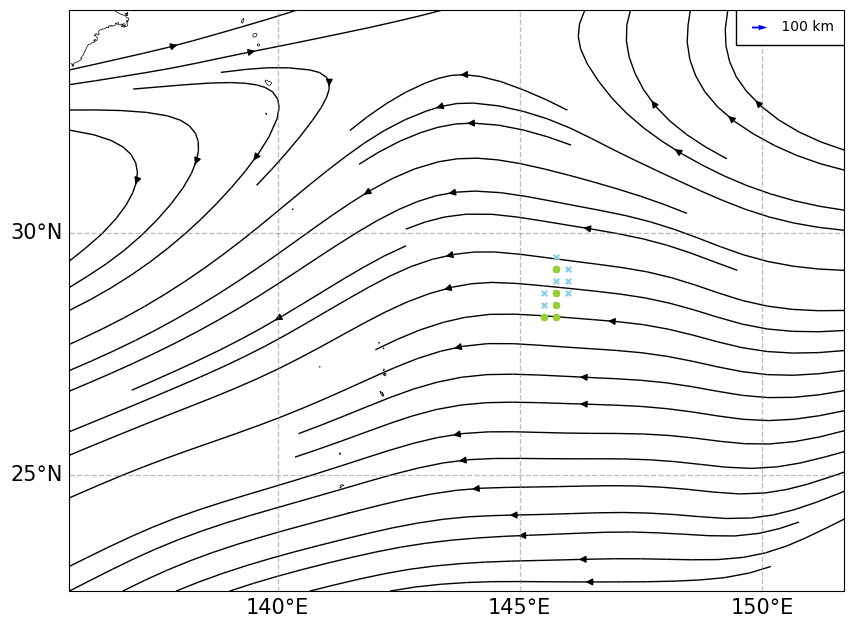

+48h PW


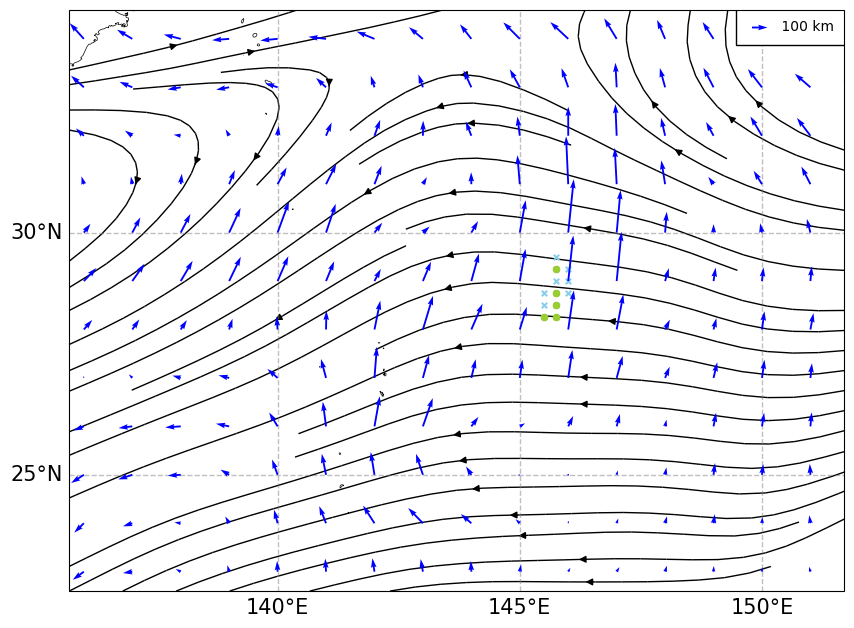

+48h CP


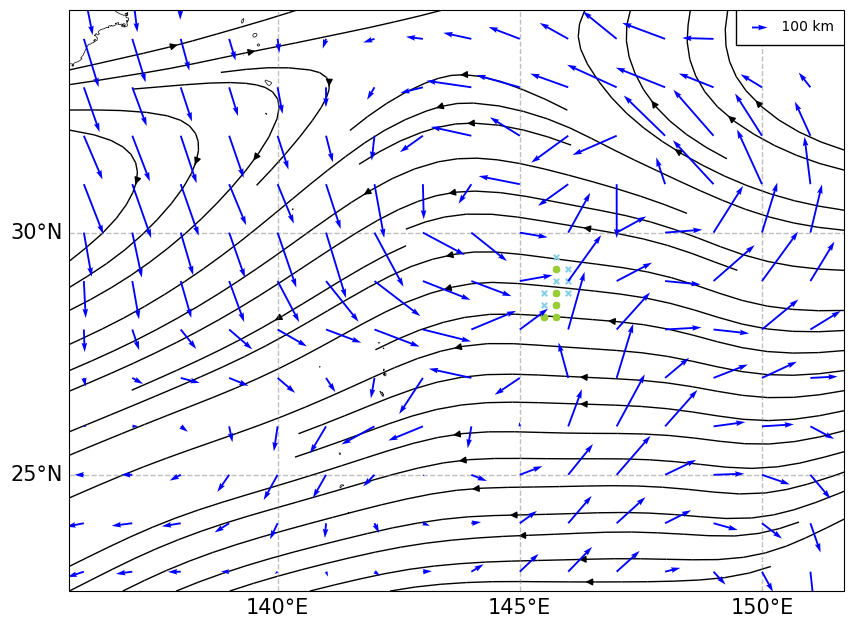

+48h Minor


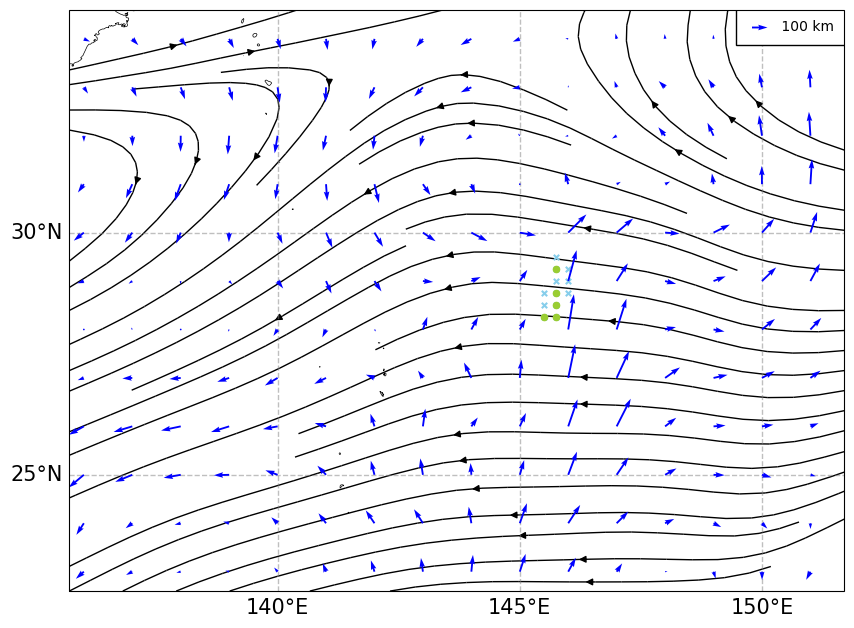

5000
+72h All


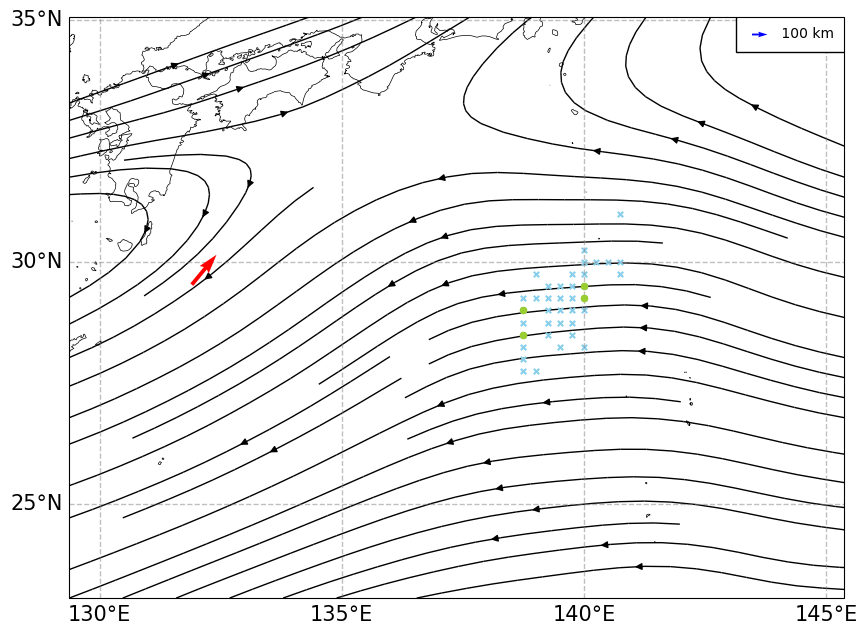

+72h PW


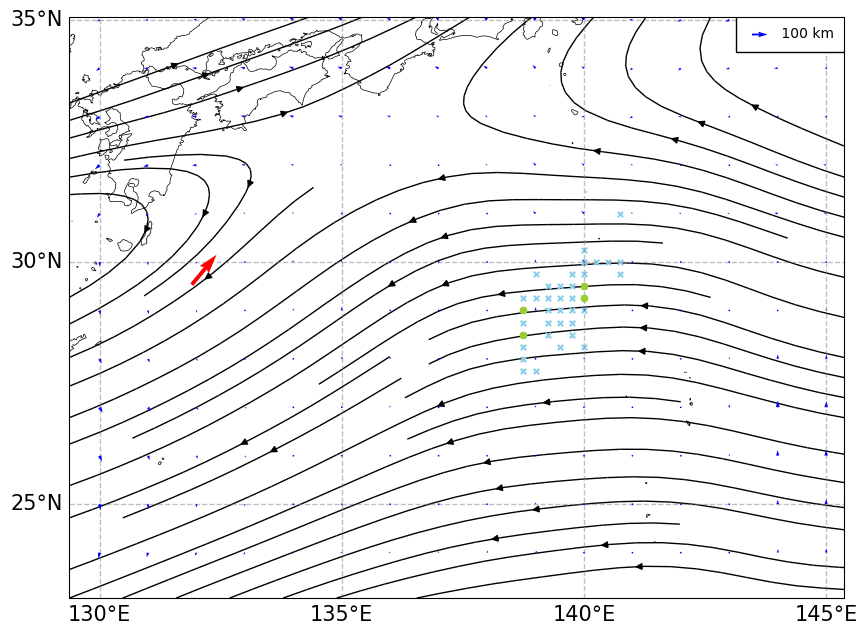

+72h CP


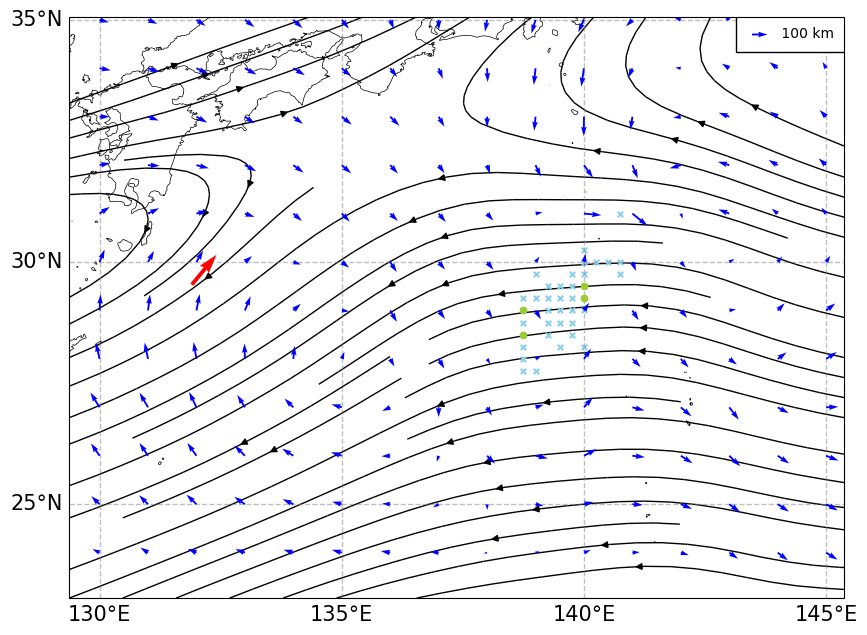

+72h Minor


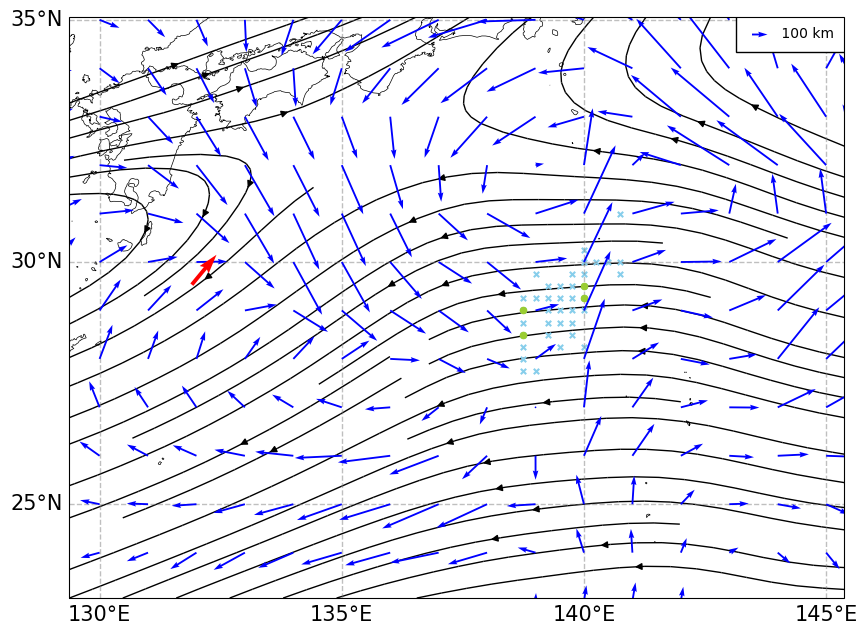

KeyError: 96

In [65]:
# with open(f'{base_output_path}/cov_timeline_{storm_name}.pkl', 'rb') as f:
#     cov_timeline = pickle.load(f)
    
for predict_interval in time_array[::4]:
    cov_pw = cov_timeline[predict_interval]['pw']
    cov_gw = cov_timeline[predict_interval]['gw']
    cov_total = cov_timeline[predict_interval]['total']
    u_mean = cov_timeline[predict_interval]['u_mean']
    v_mean = cov_timeline[predict_interval]['v_mean']
    mid_pos_group = cov_timeline[predict_interval]['mid_pos_group']
    mid_pos_all_unique = np.unique(cov_timeline[predict_interval]['mid_pos_all'], axis=0)
    cov_pw_inner = cov_timeline[predict_interval]['pw_inner']
    cov_total_inner = cov_timeline[predict_interval]['total_inner']
    cov_all = cov_timeline[predict_interval]['all']
    cov_all_inner = cov_timeline[predict_interval]['all_inner']
    cov_gw_inner = cov_timeline[predict_interval]['gw_inner']
    cov_minor = cov_timeline[predict_interval]['minor']

    mask = np.sqrt(u_mean**2 + v_mean**2) > 0.5
    U_masked = np.where(mask, u_mean, np.nan)
    V_masked = np.where(mask, v_mean, np.nan)

    if storm_name == 'HINNAMNOR':
        # scale = 10000
        scale = 5000
    else:
        scale = 5000
    quiver_step = 4
    print(scale)

    def sensitivity_plot(cov: dict = dict(), mid_pos_group: np.ndarray = np.array([])
                         , U_masked: np.ndarray = np.array([]), V_masked: np.ndarray = np.array([])
                         , lon_grid: np.ndarray = lon_grid, lat_grid: np.ndarray = lat_grid
                         , proj: ccrs.Projection = proj, predict_interval: int = 0, pca_tar: PCA = pca_tar
                         , scale: int = 10000, quiver_step: int = 4, cov_name: str = 'pw'):
        
        fig, ax = plt.subplots(1,1,figsize=(10, 8), subplot_kw={'projection': proj})
        ax.set_extent([np.mean(mid_pos_group[:,0])-10,np.mean(mid_pos_group[:,0])+6,np.mean(mid_pos_group[:,1])-6,np.mean(mid_pos_group[:,1])+6], crs=proj)
        
        print(f'+{predict_interval}h {cov_name}')
        # ax.set_title(f'+{predict_interval}h {cov_name}', fontsize=15)
        ax.coastlines(resolution='10m', linewidth=0.5, zorder = 0)
        ax.streamplot(lon_grid, lat_grid, U_masked, V_masked, density=1, linewidth=1, color='black', minlength=0.3, zorder = 0)
        ax.scatter(mid_pos_group[:,0], mid_pos_group[:,1], color='yellowgreen', s=20, zorder = 1)
        ax.scatter(mid_pos_all_unique[:,0], mid_pos_all_unique[:,1], color='skyblue', s=15, marker = 'x', zorder = 0)

        qui_all = ax.quiver(lon_grid[::quiver_step,::quiver_step], lat_grid[::quiver_step,::quiver_step], cov['u'][::quiver_step,::quiver_step], cov['v'][::quiver_step,::quiver_step], color = 'blue', scale = scale, alpha = 1, zorder = 1)
        key_all = ax.quiverkey(qui_all, 0.9, 0.97, scale/50, f"{str(int(scale/50)).rjust(4)} km", labelpos='E', coordinates='axes', color = 'blue', zorder = 11)
        
        ax.quiver(pca_tar.mean_[0], pca_tar.mean_[1], pca_tar.components_[0, 0], pca_tar.components_[0, 1]  , scale=20, color='r', width=0.005, label='Principal Axis', zorder = 2)
        rect = patches.Rectangle((0.86, 0.94), 0.15, 0.1, linewidth=1, edgecolor='black', facecolor='white', transform=ax.transAxes, zorder = 1, alpha = 1)
        ax.add_patch(rect)

        gl = ax.gridlines(crs=proj, draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', zorder= 0)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 15}
        gl.ylabel_style = {'size': 15}
        gl.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
        gl.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
        
        plt.show()

    sensitivity_plot(cov=cov_all, mid_pos_group=mid_pos_group, U_masked=U_masked, V_masked=V_masked, scale = scale
                    , lon_grid=lon_grid, lat_grid=lat_grid, proj=proj, predict_interval=predict_interval, pca_tar=pca_tar, cov_name = 'All')
    sensitivity_plot(cov=cov_pw, mid_pos_group=mid_pos_group, U_masked=U_masked, V_masked=V_masked, scale = scale
                    , lon_grid=lon_grid, lat_grid=lat_grid, proj=proj, predict_interval=predict_interval, pca_tar=pca_tar, cov_name = 'PW')
    sensitivity_plot(cov=cov_gw, mid_pos_group=mid_pos_group, U_masked=U_masked, V_masked=V_masked, scale = scale
                    , lon_grid=lon_grid, lat_grid=lat_grid, proj=proj, predict_interval=predict_interval, pca_tar=pca_tar, cov_name = 'CP')
    sensitivity_plot(cov=cov_minor, mid_pos_group=mid_pos_group, U_masked=U_masked, V_masked=V_masked, scale = scale
                    , lon_grid=lon_grid, lat_grid=lat_grid, proj=proj, predict_interval=predict_interval, pca_tar=pca_tar, cov_name = 'Minor')

In [143]:
scale

5000

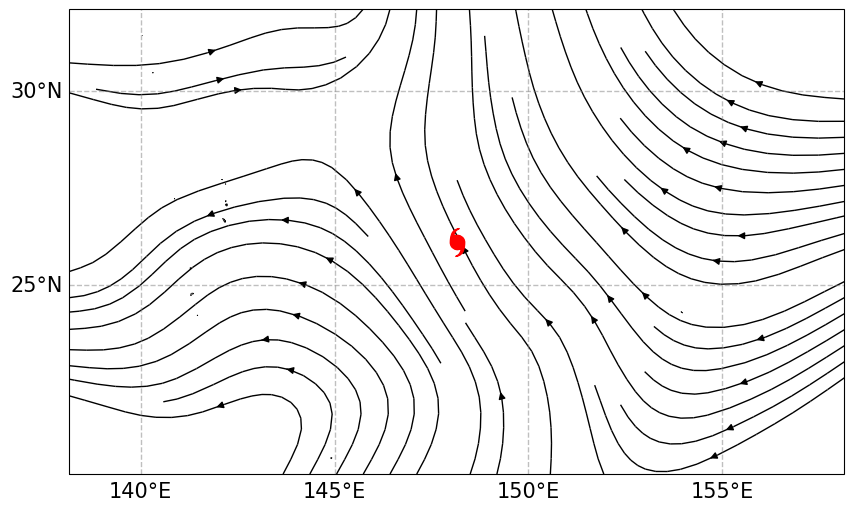

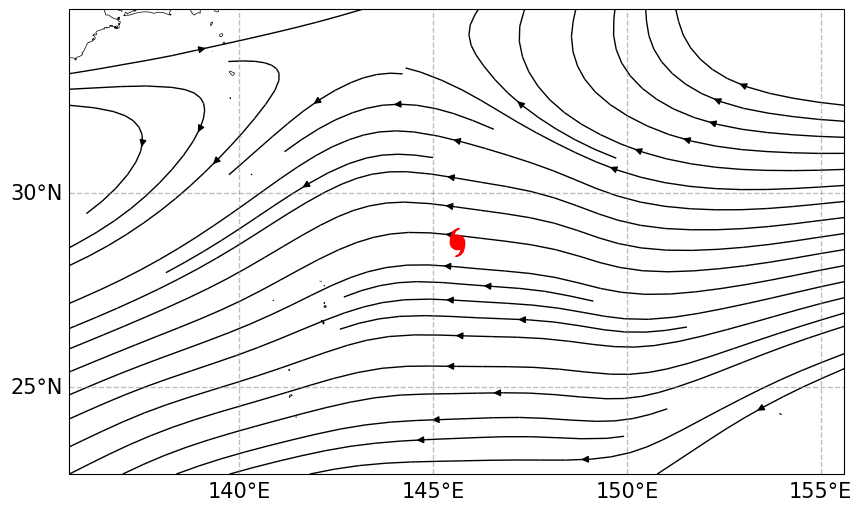

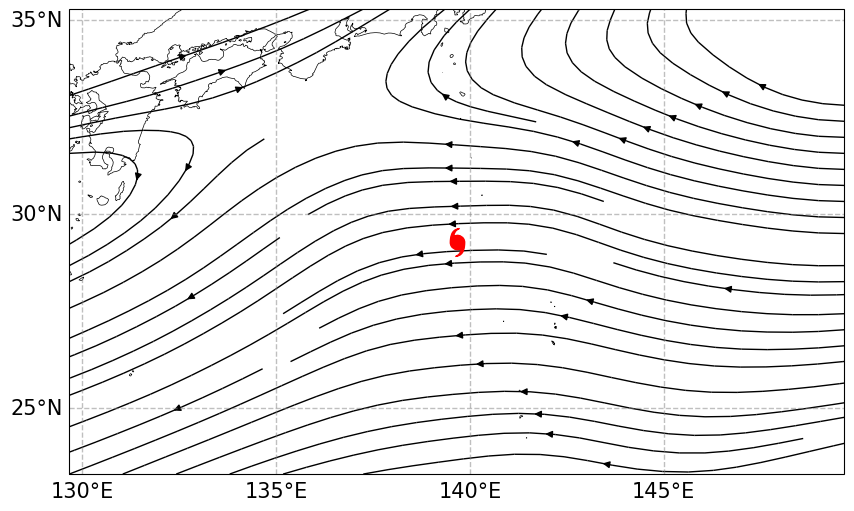

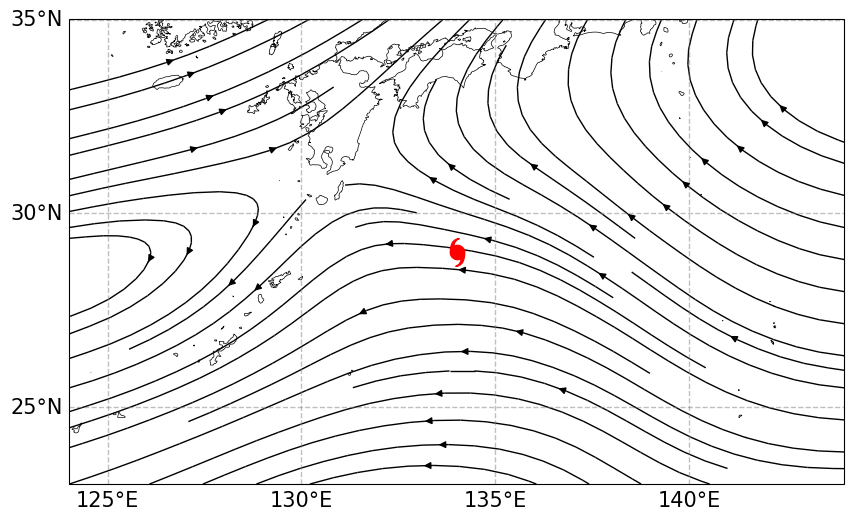

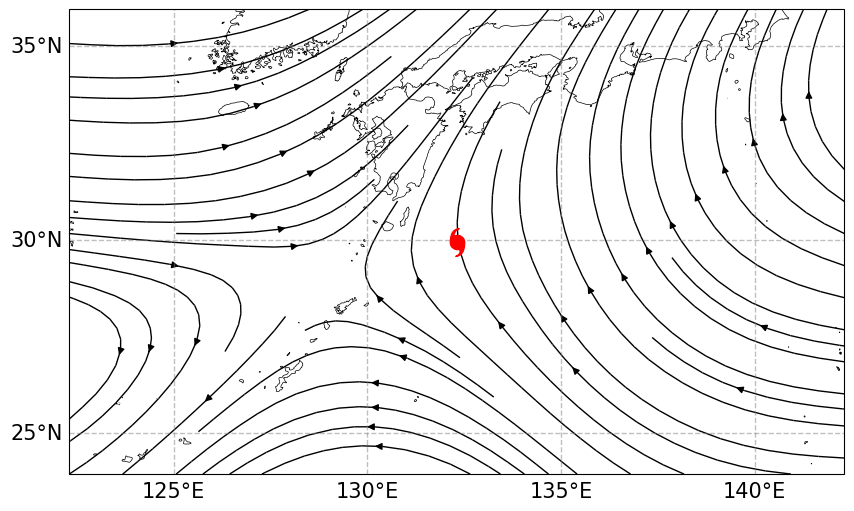

In [106]:
# with open(f'{base_output_path}/cov_timeline_{storm_name}.pkl', 'rb') as f:
#     cov_timeline = pickle.load(f)
    
for predict_interval in time_array[::4]:
    cov_pw = cov_timeline[predict_interval]['pw']
    cov_gw = cov_timeline[predict_interval]['gw']
    cov_total = cov_timeline[predict_interval]['total']
    u_mean = cov_timeline[predict_interval]['u_mean']
    v_mean = cov_timeline[predict_interval]['v_mean']
    mid_pos_group = cov_timeline[predict_interval]['mid_pos_group']
    mid_pos_all_unique = np.unique(cov_timeline[predict_interval]['mid_pos_all'], axis=0)
    cov_pw_inner = cov_timeline[predict_interval]['pw_inner']
    cov_total_inner = cov_timeline[predict_interval]['total_inner']
    cov_all = cov_timeline[predict_interval]['all']
    cov_all_inner = cov_timeline[predict_interval]['all_inner']
    cov_gw_inner = cov_timeline[predict_interval]['gw_inner']
    minor = cov_timeline[predict_interval]['minor']

    mask = np.sqrt(u_mean**2 + v_mean**2) > 0.5
    U_masked = np.where(mask, u_mean, np.nan)
    V_masked = np.where(mask, v_mean, np.nan)

    if storm_name == 'Hinnamnor':
        scale = 10000
    else:
        scale = 5000
    quiver_step = 4

    def sensitivity_plot(cov: dict = dict(), mid_pos_group: np.ndarray = np.array([])
                         , U_masked: np.ndarray = np.array([]), V_masked: np.ndarray = np.array([])
                         , lon_grid: np.ndarray = lon_grid, lat_grid: np.ndarray = lat_grid
                         , proj: ccrs.Projection = proj, predict_interval: int = 0, pca_tar: PCA = pca_tar
                         , scale: int = 10000, quiver_step: int = 4, cov_name: str = 'pw'):
        
        fig, ax = plt.subplots(1,1,figsize=(10, 8), subplot_kw={'projection': proj})
        ax.set_extent([np.mean(mid_pos_group[:,0])-10,np.mean(mid_pos_group[:,0])+10,np.mean(mid_pos_group[:,1])-6,np.mean(mid_pos_group[:,1])+6], crs=proj)
        
        ax.coastlines(resolution='10m', linewidth=0.5, zorder = 0)
        ax.streamplot(lon_grid, lat_grid, U_masked, V_masked, density=1, linewidth=1, color='black', minlength=0.3, zorder = 0)
        ax.scatter(np.mean(mid_pos_group[:,0]), np.mean(mid_pos_group[:,1]), color='r', s=100, zorder = 1, marker = tcmarkers.HU)

        gl = ax.gridlines(crs=proj, draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', zorder= 0)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 15}
        gl.ylabel_style = {'size': 15}
        gl.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
        gl.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
        
        plt.show()

    sensitivity_plot(cov=cov_all, mid_pos_group=mid_pos_group, U_masked=U_masked, V_masked=V_masked
                    , lon_grid=lon_grid, lat_grid=lat_grid, proj=proj, predict_interval=predict_interval, pca_tar=pca_tar, cov_name = 'All')

## Sensitivity streamplot

24


/tmp/ipykernel_715779/2699192076.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


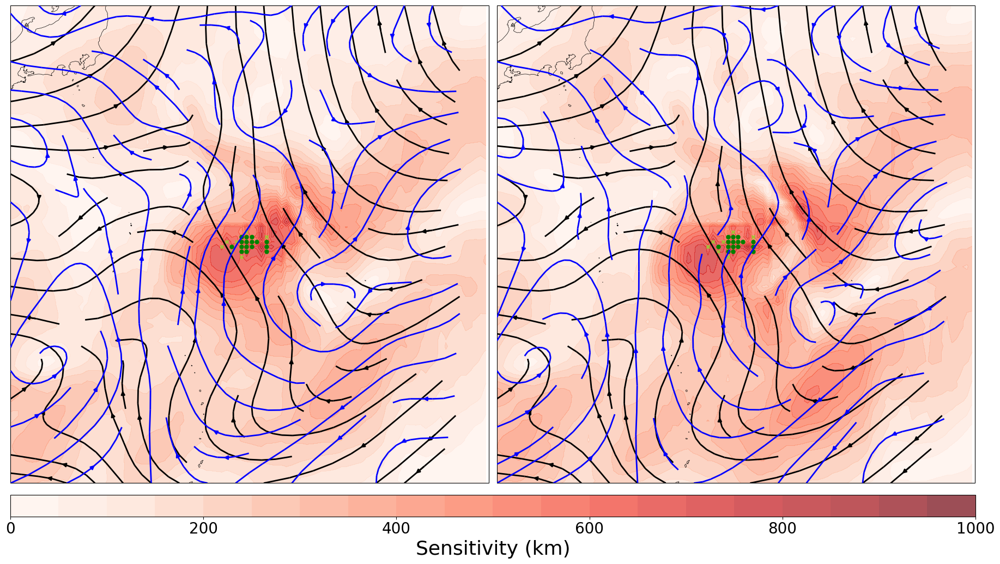

72


/tmp/ipykernel_715779/2699192076.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


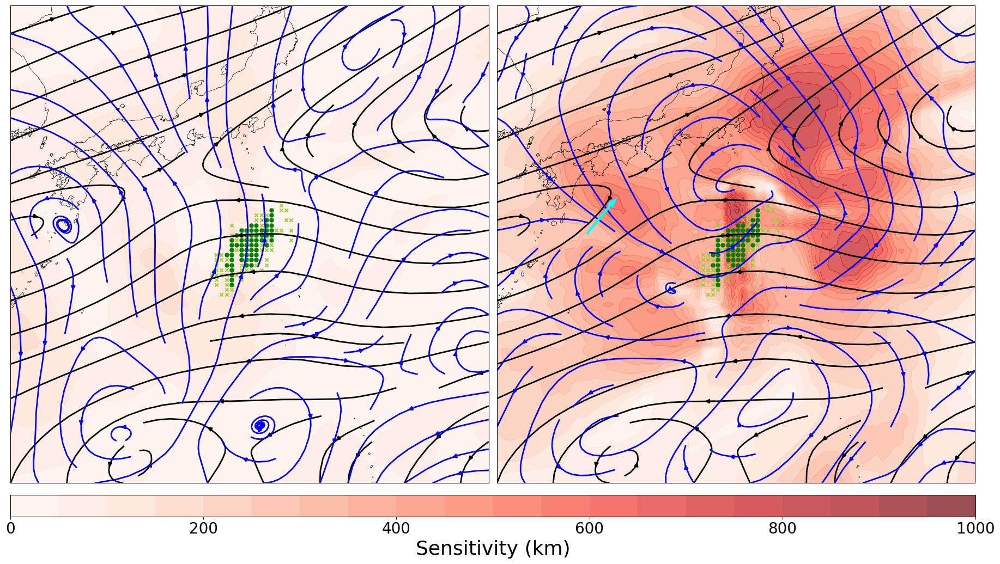

120


/tmp/ipykernel_715779/2699192076.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


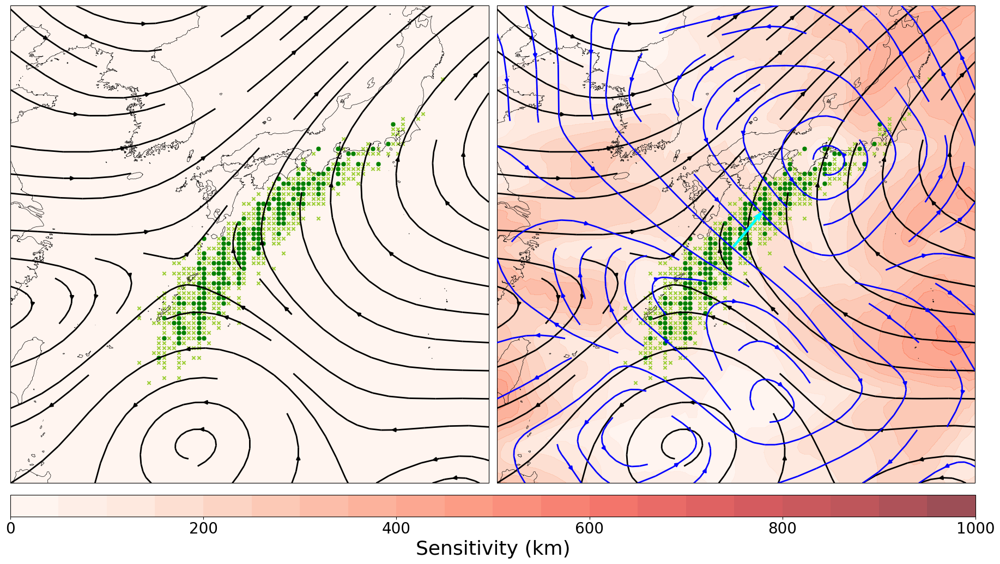

In [14]:
if (lon_grid > 180).all():
    lon_grid = lon_grid - 360
    print('lon_grid shifted:')

# with open(f'{base_output_path}/cov_timeline_{storm_name}.pkl', 'rb') as f:
#     cov_timeline = pickle.load(f)

#! scale 설정
scale = 10000
max_sen = 1000
ax_extend = 12

for predict_interval in time_array[::8]:
    cov_pw = cov_timeline[predict_interval]['pw']
    cov_all = cov_timeline[predict_interval]['all']
    cov_pw_inner = cov_timeline[predict_interval]['pw_inner']
    cov_all_inner = cov_timeline[predict_interval]['all_inner']
    u_mean = cov_timeline[predict_interval]['u_mean']
    v_mean = cov_timeline[predict_interval]['v_mean']
    mid_pos_group = cov_timeline[predict_interval]['mid_pos_group']
    mid_pos_all_unique = np.unique(cov_timeline[predict_interval]['mid_pos_all'], axis=0)

    # --- 그림 생성
    fig, axs = plt.subplots(1, 2, figsize=(18, 10), subplot_kw={'projection': proj})
    ax1, ax2 = axs
    fp = FontProperties(family='sans-serif', size=12, weight='bold')

    # --- extent 세팅
    for ax in axs:
        ax.set_extent([
            np.mean(mid_pos_group[:,0]) - ax_extend, np.mean(mid_pos_group[:,0]) + ax_extend,
            np.mean(mid_pos_group[:,1]) - ax_extend, np.mean(mid_pos_group[:,1]) + ax_extend
        ], crs=proj)
        ax.coastlines(resolution='10m', linewidth=0.5)

    # fig.suptitle(f'{predict_interval}h', fontsize=30, fontweight='bold', y=0.95)
    print(predict_interval)
    # --- 첫 번째 plot
    magnitude_pw = np.sqrt(cov_pw['u']**2 + cov_pw['v']**2)
    cax1 = ax1.contourf(
        lon_grid, lat_grid, magnitude_pw, levels=np.linspace(0, scale/10, 21), cmap='Reds', alpha=0.7, zorder=-1
    )
    sen_u = np.where(magnitude_pw > 1, cov_pw['u'], np.nan)
    sen_v = np.where(magnitude_pw > 1, cov_pw['v'], np.nan)
    
    ax1.scatter(mid_pos_group[:,0], mid_pos_group[:,1], color='green', s=25, zorder=2)
    ax1.scatter(mid_pos_all_unique[:,0], mid_pos_all_unique[:,1], color='yellowgreen', s=20, marker='x', zorder=1)
    
    ax1.streamplot(lon_grid, lat_grid, u_mean, v_mean, density=0.6, color='black', linewidth=2, zorder=3)
    ax1.streamplot(lon_grid, lat_grid, sen_u , sen_v,  density=0.6, color='blue', linewidth=2, zorder=3)

    # qui_all_inner = ax2.quiver(np.mean(mid_pos_group[:,0]), np.mean(mid_pos_group[:,1]), cov_all_inner['u'], cov_all_inner['v'], color="aqua", scale=scale/5, width=0.005, zorder=20)
    # key_all_inner = ax2.quiverkey(qui_all_inner, 0.91, 0.98, scale/50, rf"${scale/50:.0f}\ km$", labelpos='E', coordinates='axes', color = "aqua", zorder = 20, fontproperties=fp)
    # rect2 = patches.Rectangle((0.80, 0.96), 0.2, 0.04, linewidth=1, edgecolor='black', facecolor='white', transform=ax2.transAxes, zorder=14, alpha=1)
    # ax2.add_patch(rect2)
    

    # ax2.quiver(pca_tar.mean_[0], pca_tar.mean_[1], pca_tar.components_[0, 0], pca_tar.components_[0, 1], scale=10, color="#D400FF", width=0.005, label='Principal Axis', zorder = 15)
    ax2.quiver(pca_tar.mean_[0], pca_tar.mean_[1], pca_tar.components_[0, 0], pca_tar.components_[0, 1], scale=10, color="aqua", width=0.005, label='Principal Axis', zorder = 15)


    # --- 두 번째 plot
    magnitude_all = np.sqrt(cov_all['u']**2 + cov_all['v']**2)
    cax2 = ax2.contourf(
        lon_grid, lat_grid, magnitude_all, levels=np.linspace(0, scale/10, 21), cmap='Reds', alpha=0.7, zorder=-1
    )
    sen_u = np.where(magnitude_all > 1, cov_all['u'], np.nan)
    sen_v = np.where(magnitude_all > 1, cov_all['v'], np.nan)
    
    ax2.scatter(mid_pos_group[:,0], mid_pos_group[:,1], color='green', s=25, zorder=2)
    ax2.scatter(mid_pos_all_unique[:,0], mid_pos_all_unique[:,1], color='yellowgreen', s=20, marker='x', zorder=1)

    ax2.streamplot(lon_grid, lat_grid, u_mean, v_mean, density=0.6, color='black', linewidth=2, zorder=3)
    ax2.streamplot(lon_grid, lat_grid, sen_u,  sen_v, density=0.6, color='blue', linewidth=2, zorder=3)
    
    # qui_all_inner = ax2.quiver(np.mean(mid_pos_group[:,0]), np.mean(mid_pos_group[:,1]), cov_all_inner['u'], cov_all_inner['v'], color="aqua", scale=scale/5, width=0.005, zorder=20)
    # key_all_inner = ax2.quiverkey(qui_all_inner, 0.91, 0.98, scale/50, rf"${scale/50:.0f}\ km$", labelpos='E', coordinates='axes', color = "aqua", zorder = 20, fontproperties=fp)
    # rect2 = patches.Rectangle((0.80, 0.96), 0.2, 0.04, linewidth=1, edgecolor='black', facecolor='white', transform=ax2.transAxes, zorder=14, alpha=1)
    # ax2.add_patch(rect2)
    

    # ax2.quiver(pca_tar.mean_[0], pca_tar.mean_[1], pca_tar.components_[0, 0], pca_tar.components_[0, 1], scale=10, color="#D400FF", width=0.005, label='Principal Axis', zorder = 15)
    ax2.quiver(pca_tar.mean_[0], pca_tar.mean_[1], pca_tar.components_[0, 0], pca_tar.components_[0, 1], scale=10, color="aqua", width=0.005, label='Principal Axis', zorder = 15)

    # 컬러바를 위한 새 axes 생성 (fig의 맨 아래, 좌~우 전체 폭)
    cbar_ax = fig.add_axes([0.008, 0, 0.984, 0.04])  # [left, bottom, width, height]
    cbar = fig.colorbar(
        cax1, cax=cbar_ax, orientation='horizontal', extend='both'
    )
    cbar.set_label('Sensitivity (km)', fontsize=26)
    cbar.set_ticks(np.linspace(0, scale/10, 6))
    cbar.ax.tick_params(labelsize=20) 

    plt.tight_layout()
    plt.show()


## <span style="color: white; background-color:rgb(194, 160, 99); padding:5px 20px; border-radius: 20px; font-weight:bold; font-size: 30pt"> All time step sensitivity figure</span>

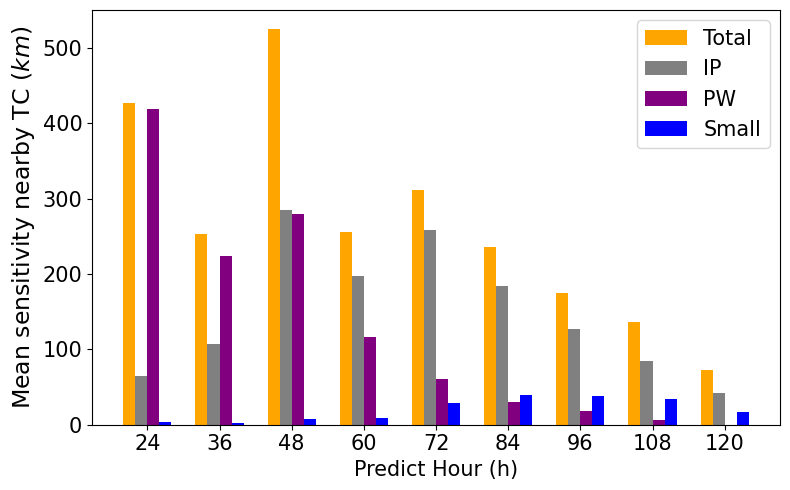

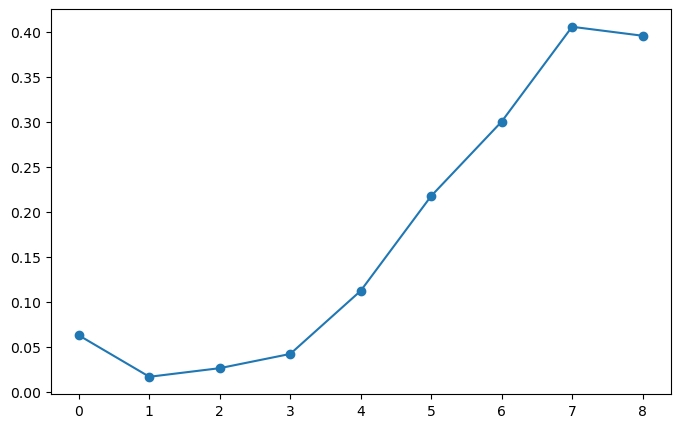

In [16]:
def compute_magnitude(u, v):
    return np.sqrt(np.square(u) + np.square(v))

all_mags = []
pw_mags = []
gw_mags = []
mi_mags = []

for t in time_array[::2]:
    all_u = cov_timeline[t]['all_inner']['u']
    all_v = cov_timeline[t]['all_inner']['v']
    pw_u = cov_timeline[t]['pw_inner']['u']   
    pw_v = cov_timeline[t]['pw_inner']['v']
    gw_u = cov_timeline[t]['gw_inner']['u']
    gw_v = cov_timeline[t]['gw_inner']['v']
    mi_u = cov_timeline[t]['minor_inner']['u']
    mi_v = cov_timeline[t]['minor_inner']['v']

    # 벡터 크기 평균
    all_mag = np.mean(compute_magnitude(all_u, all_v))
    pw_mag = np.mean(compute_magnitude(pw_u, pw_v))
    gw_mag = np.mean(compute_magnitude(gw_u, gw_v))
    mi_mag = np.mean(compute_magnitude(mi_u, mi_v))

    all_mags.append(all_mag)
    pw_mags.append(pw_mag)
    gw_mags.append(gw_mag)
    mi_mags.append(mi_mag)

plt.figure(figsize=(8, 5))

plt.bar(time_array[::2]-3, all_mags, width=2, color='orange', label = 'Total')
plt.bar(time_array[::2]-1, gw_mags, width=2, color='gray', label = 'IP')
plt.bar(time_array[::2]+1, pw_mags, width=2, color='purple', label = 'PW')
plt.bar(time_array[::2]+3, mi_mags, width=2, color='blue', label = 'Small')
plt.xlabel("Predict Hour (h)", fontsize=15)
plt.ylabel("Mean sensitivity nearby TC ($km$)", fontsize=17)
plt.xticks(time_array[::2], fontsize = 15)
plt.yticks(fontsize = 15)
plt.ylim(0, 550)
plt.legend(fontsize = 15)


plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(np.array(mi_mags)/np.array(gw_mags), label='PW/GW', marker='o')


plt.show()

In [129]:
for t in time_array[::]:
    print(f'{t}h')
    pw_len = np.mean(cov_timeline[t]['pw']['u']**2 + cov_timeline[t]['pw']['v']**2)**0.5
    gw_len = np.mean(cov_timeline[t]['gw']['u']**2 + cov_timeline[t]['gw']['v']**2)**0.5
    min_len = np.mean(cov_timeline[t]['minor']['u']**2 + cov_timeline[t]['minor']['v']**2)**0.5
    diff_len = np.mean(cov_timeline[t]['diff']['u']**2 + cov_timeline[t]['diff']['v']**2)**0.5
    all_len = np.mean(cov_timeline[t]['all']['u']**2 + cov_timeline[t]['all']['v']**2)**0.5

    print(f'PW: {pw_len/all_len:.2f}, GW: {gw_len/all_len:.2f}, Min: {min_len/all_len:.2f}, Diff: {diff_len/all_len:.2f}')

24h
PW: 0.88, GW: 0.25, Min: 0.03, Diff: 0.00
30h
PW: 0.74, GW: 0.39, Min: 0.04, Diff: 0.00
36h
PW: 0.69, GW: 0.53, Min: 0.03, Diff: 0.03
42h
PW: 0.64, GW: 0.59, Min: 0.06, Diff: 0.01
48h
PW: 0.57, GW: 0.73, Min: 0.03, Diff: 0.01
54h
PW: 0.49, GW: 0.76, Min: 0.06, Diff: 0.00
60h
PW: 0.43, GW: 0.82, Min: 0.05, Diff: 0.00
66h
PW: 0.36, GW: 0.78, Min: 0.10, Diff: 0.01
72h
PW: 0.33, GW: 0.79, Min: 0.11, Diff: 0.02
78h
PW: 0.31, GW: 0.75, Min: 0.16, Diff: 0.01
84h
PW: 0.29, GW: 0.70, Min: 0.21, Diff: 0.02
90h
PW: 0.29, GW: 0.71, Min: 0.21, Diff: 0.01
96h
PW: 0.19, GW: 0.70, Min: 0.26, Diff: 0.02
102h
PW: 0.15, GW: 0.67, Min: 0.30, Diff: 0.02
108h
PW: 0.11, GW: 0.61, Min: 0.37, Diff: 0.02
114h
PW: 0.07, GW: 0.57, Min: 0.43, Diff: 0.01
120h
PW: 0.00, GW: 0.62, Min: 0.39, Diff: 0.01


### **Ensemble tracks and ESA evolution**

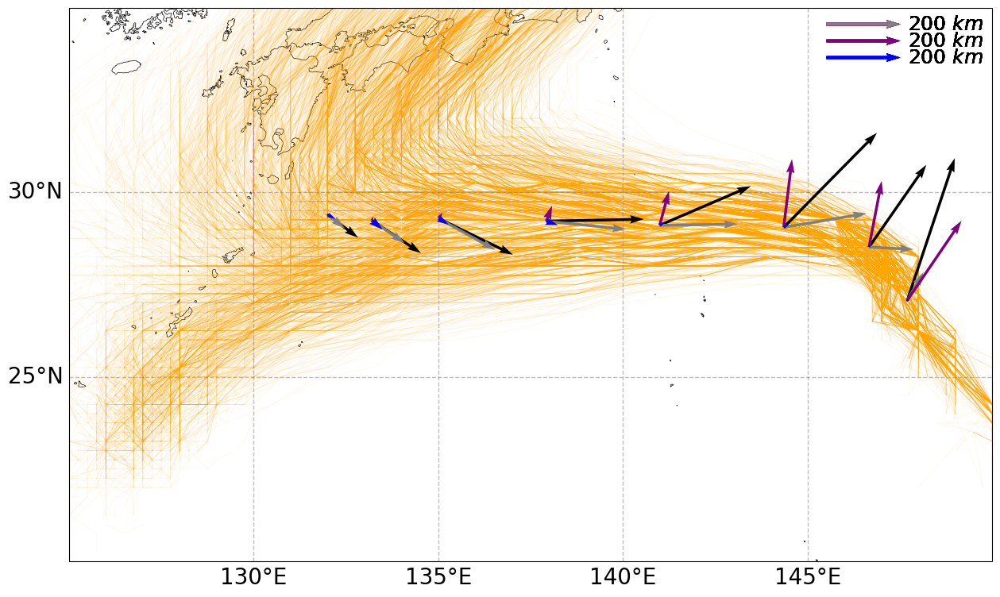

In [33]:
from matplotlib.font_manager import FontProperties

fontprops = FontProperties(size=18)  # 원하는 폰트 크기

# with open(f'{base_output_path}/cov_timeline_{storm_name}.pkl', 'rb') as f:
#     cov_timeline = pickle.load(f)

for key_time ,min_position in ssv_dict.items():
    fig, ax = plt.subplots(1, 1, figsize=(10*latlon_ratio, 10), subplot_kw={'projection': proj})
    key_str = key_time.strftime("%m.%d.%HUTC")
    ax.set_extent([125,150,20,35], crs=proj)
    ax.coastlines(resolution='10m', linewidth=0.5, zorder = 0)

    for ens in ens_list:  

        lons = [pos['lon'] for _,pos in min_position[ens].items()]
        lats = [pos['lat'] for _,pos in min_position[ens].items()]
        min_values = [pos['mslp'] for _,pos in min_position[ens].items()]
        pred_times = [pos for pos,_ in min_position[ens].items()]
        plt.plot(lons, lats, transform=ax.projection, zorder=0, color='orange', linewidth=0.5, alpha=0.1)


for t in time_array[1::2]:
    pw_u = cov_timeline[t]['pw_inner']['u']   
    pw_v = cov_timeline[t]['pw_inner']['v']
    gw_u = cov_timeline[t]['gw_inner']['u']
    gw_v = cov_timeline[t]['gw_inner']['v']
    mi_u = cov_timeline[t]['minor_inner']['u']
    mi_v = cov_timeline[t]['minor_inner']['v']
    all_u = cov_timeline[t]['all_inner']['u']
    all_v = cov_timeline[t]['all_inner']['v']

    mean_lon = np.mean(cov_timeline[t]['mid_pos_all'][:, 0])
    mean_lat = np.mean(cov_timeline[t]['mid_pos_all'][:, 1])

    scale = 5000
    

    qui_all = plt.quiver(mean_lon, mean_lat, all_u, all_v, color='black', scale=2500, width=0.003, label='All', alpha=1, zorder = 10)
    key_all = ax.quiverkey(qui_all, 0.9, 0.97, scale/25, f'${int(scale/25)}\\ km$', labelpos='E', coordinates='axes', color='purple', fontproperties=fontprops)
    qui_gw = plt.quiver(mean_lon, mean_lat, gw_u, gw_v, color='gray', scale=2500, width=0.003, label='CP', alpha=1, zorder = 10)
    key_gw = ax.quiverkey(qui_gw, 0.9, 0.97, scale/25, f'${int(scale/25)}\\ km$', labelpos='E', coordinates='axes', color='gray', fontproperties=fontprops)
    qui_pw = plt.quiver(mean_lon, mean_lat, pw_u, pw_v, color='purple', scale=2500, width=0.003, label='PW', alpha=1, zorder = 10)
    key_pw = ax.quiverkey(qui_pw, 0.9, 0.94, scale/25, f'${int(scale/25)}\\ km$', labelpos='E', coordinates='axes', color='purple', fontproperties=fontprops)
    qui_mi = plt.quiver(mean_lon, mean_lat, mi_u, mi_v, color='blue', scale=2500, width=0.003, label='Minor', alpha=1, zorder = 10)
    key_mi = ax.quiverkey(qui_mi, 0.9, 0.91, scale/25, f'${int(scale/25)}\\ km$', labelpos='E', coordinates='axes', color='blue', fontproperties=fontprops)

gl = ax.gridlines(crs=proj, draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', zorder= 0)
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 20}
gl.ylabel_style = {'size': 20}
gl.xlocator = mticker.FixedLocator(np.arange(-180, 180, 5))
gl.ylocator = mticker.FixedLocator(np.arange(-90, 90, 5))
plt.show()
    

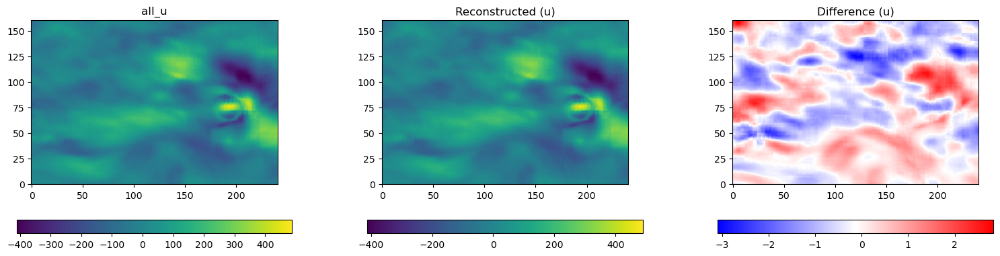

Metrics for u:
  RMSE: 0.8581
  MAE: 0.6723
  Correlation: 1.0000
  R2: 0.9999


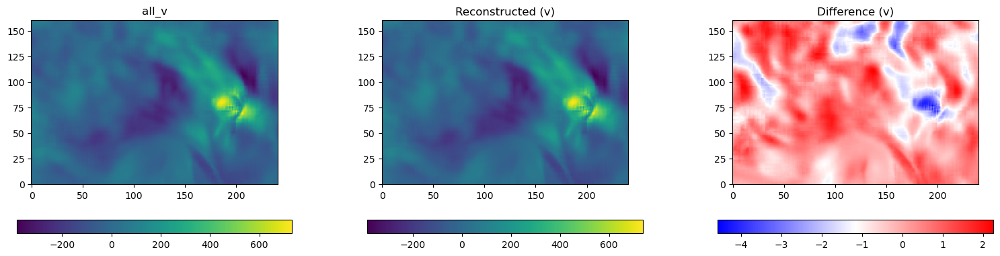

Metrics for v:
  RMSE: 0.9435
  MAE: 0.7316
  Correlation: 1.0000
  R2: 0.9999


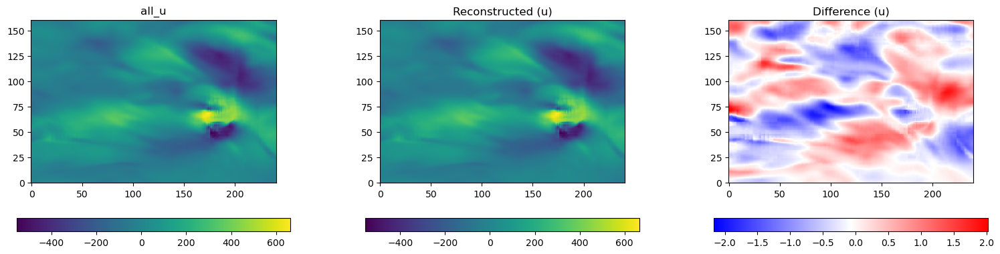

Metrics for u:
  RMSE: 0.6416
  MAE: 0.5010
  Correlation: 1.0000
  R2: 1.0000


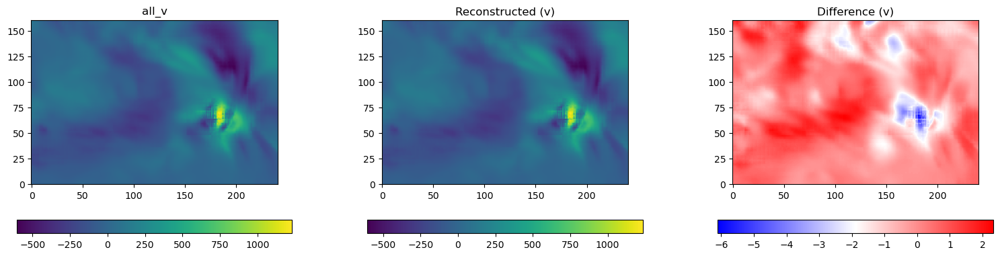

Metrics for v:
  RMSE: 0.9578
  MAE: 0.7151
  Correlation: 1.0000
  R2: 1.0000


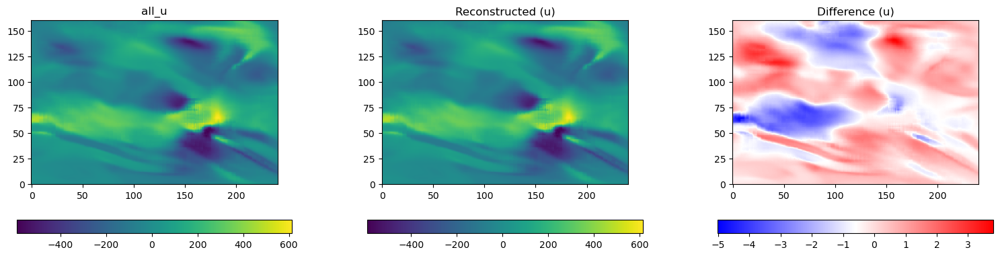

Metrics for u:
  RMSE: 1.2346
  MAE: 0.9261
  Correlation: 1.0000
  R2: 0.9999


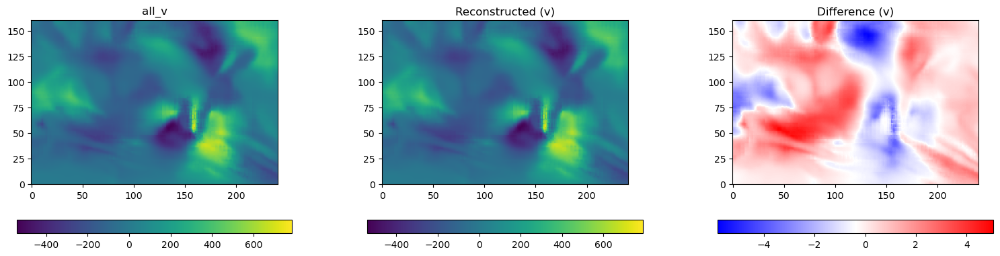

Metrics for v:
  RMSE: 1.6447
  MAE: 1.2533
  Correlation: 1.0000
  R2: 0.9999


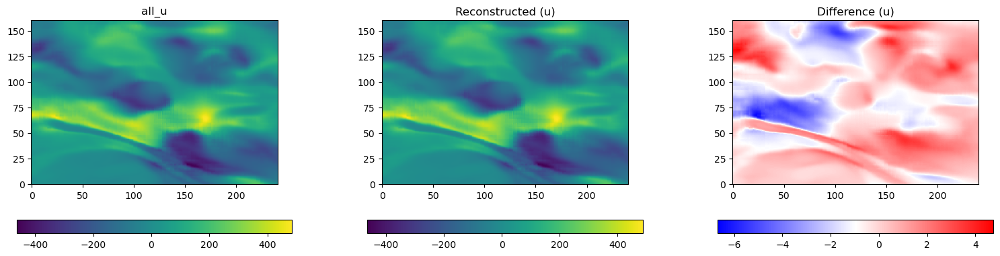

Metrics for u:
  RMSE: 1.7034
  MAE: 1.2915
  Correlation: 1.0000
  R2: 0.9999


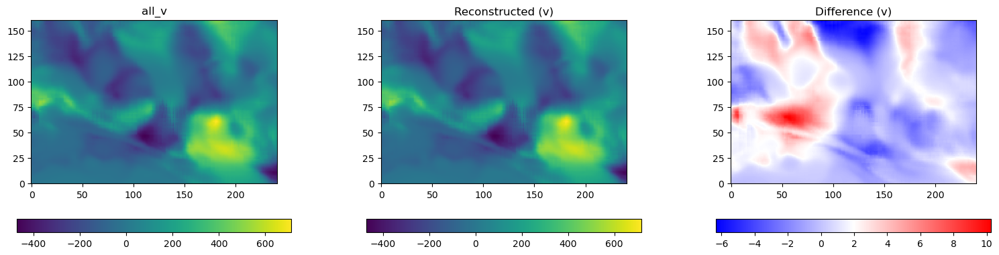

Metrics for v:
  RMSE: 2.3547
  MAE: 1.7679
  Correlation: 0.9999
  R2: 0.9999


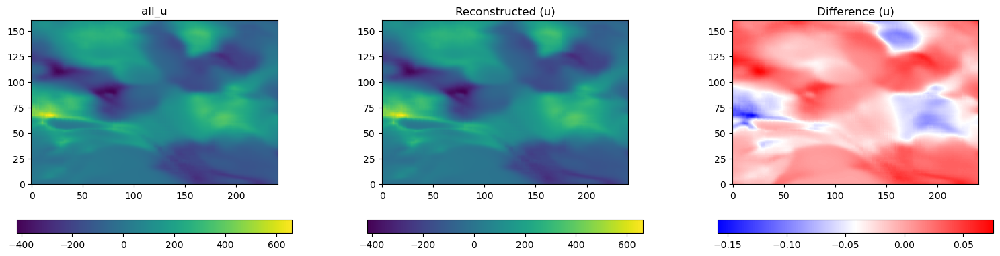

Metrics for u:
  RMSE: 0.0333
  MAE: 0.0258
  Correlation: 1.0000
  R2: 1.0000


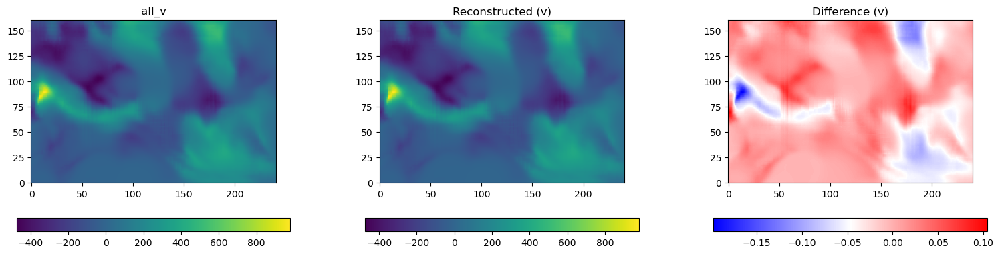

Metrics for v:
  RMSE: 0.0353
  MAE: 0.0259
  Correlation: 1.0000
  R2: 1.0000


In [57]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

class FieldReconstructionAnalysis:
    def __init__(self, all_field, pw, gw, minor, diff, name="v"):
        """
        all_field: 2D numpy array
        pw, gw, minor, diff: 2D numpy arrays (same shape as all_field)
        name: str, e.g., "u" or "v"
        """
        self.all_field = all_field
        self.recon = pw + gw + minor + diff
        self.diff = all_field - self.recon
        self.name = name

    def plot_fields(self):
        plt.figure(figsize=(16, 4))
        plt.subplot(1, 3, 1)
        plt.title(f'all_{self.name}')
        plt.imshow(self.all_field, origin='lower')
        plt.colorbar(orientation='horizontal', shrink=0.8)
        plt.subplot(1, 3, 2)
        plt.title(f'Reconstructed ({self.name})')
        plt.imshow(self.recon, origin='lower')
        plt.colorbar(orientation='horizontal', shrink=0.8)
        plt.subplot(1, 3, 3)
        plt.title(f'Difference ({self.name})')
        plt.imshow(self.diff, origin='lower', cmap='bwr')
        plt.colorbar(orientation='horizontal', shrink=0.8)
        plt.tight_layout()
        plt.show()

    def metrics(self, print_metrics=True):
        rmse = np.sqrt(np.nanmean((self.all_field - self.recon) ** 2))
        corr = np.corrcoef(self.all_field.flatten(), self.recon.flatten())[0, 1]
        mae = np.nanmean(np.abs(self.all_field - self.recon))
        r2 = r2_score(self.all_field.flatten(), self.recon.flatten())
        if print_metrics:
            print(f"Metrics for {self.name}:")
            print(f"  RMSE: {rmse:.4f}")
            print(f"  MAE: {mae:.4f}")
            print(f"  Correlation: {corr:.4f}")
            print(f"  R2: {r2:.4f}")
        return {"rmse": rmse, "mae": mae, "corr": corr, "r2": r2}

    def show_all(self):
        self.plot_fields()
        return self.metrics()




for t in time_array[::4]:
    all_u = cov_timeline[t]['all']['u']
    all_v = cov_timeline[t]['all']['v']
    pw_u = cov_timeline[t]['pw']['u']
    pw_v = cov_timeline[t]['pw']['v']
    gw_u = cov_timeline[t]['gw']['u']
    gw_v = cov_timeline[t]['gw']['v']
    minor_u = cov_timeline[t]['minor']['u']
    minor_v = cov_timeline[t]['minor']['v']
    diff_u = cov_timeline[t]['diff']['u']
    diff_v = cov_timeline[t]['diff']['v']

    # u field
    u_analysis = FieldReconstructionAnalysis(all_u, pw_u, gw_u, minor_u, diff_u, name="u")
    u_analysis.show_all()
    
    # v field
    v_analysis = FieldReconstructionAnalysis(all_v, pw_v, gw_v, minor_v, diff_v, name="v")
    v_analysis.show_all()


   

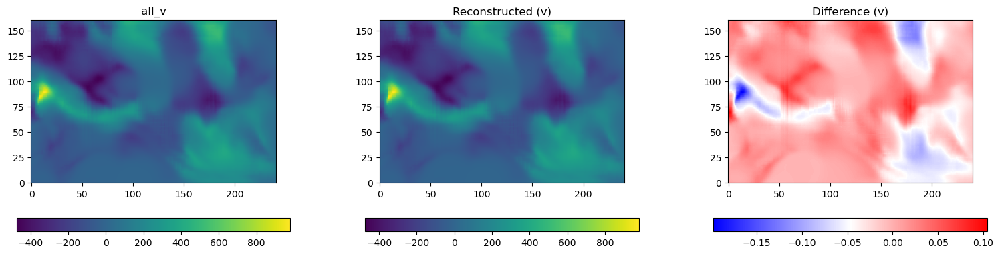

Metrics for v:
  RMSE: 0.0353
  MAE: 0.0259
  Correlation: 1.0000
  R2: 1.0000


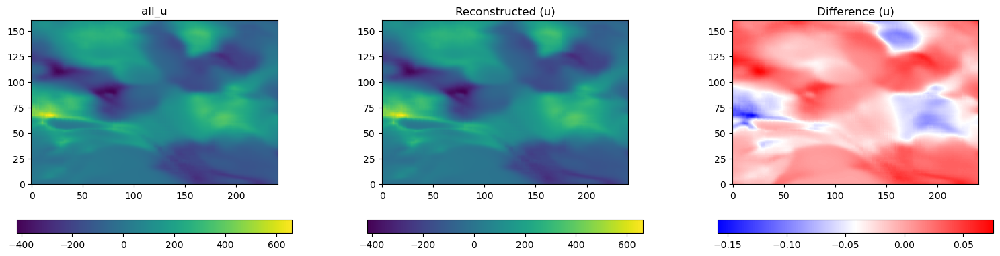

Metrics for u:
  RMSE: 0.0333
  MAE: 0.0258
  Correlation: 1.0000
  R2: 1.0000


{'rmse': 0.03330366674452447,
 'mae': 0.02578201208381044,
 'corr': 0.9999999936790358,
 'r2': 0.9999999554150012}

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

class FieldReconstructionAnalysis:
    def __init__(self, all_field, pw, gw, minor, diff, name="v"):
        """
        all_field: 2D numpy array
        pw, gw, minor, diff: 2D numpy arrays (same shape as all_field)
        name: str, e.g., "u" or "v"
        """
        self.all_field = all_field
        self.recon = pw + gw + minor + diff
        self.diff = all_field - self.recon
        self.name = name

    def plot_fields(self):
        plt.figure(figsize=(16, 4))
        plt.subplot(1, 3, 1)
        plt.title(f'all_{self.name}')
        plt.imshow(self.all_field, origin='lower')
        plt.colorbar(orientation='horizontal', shrink=0.8)
        plt.subplot(1, 3, 2)
        plt.title(f'Reconstructed ({self.name})')
        plt.imshow(self.recon, origin='lower')
        plt.colorbar(orientation='horizontal', shrink=0.8)
        plt.subplot(1, 3, 3)
        plt.title(f'Difference ({self.name})')
        plt.imshow(self.diff, origin='lower', cmap='bwr')
        plt.colorbar(orientation='horizontal', shrink=0.8)
        plt.tight_layout()
        plt.show()

    def metrics(self, print_metrics=True):
        rmse = np.sqrt(np.nanmean((self.all_field - self.recon) ** 2))
        corr = np.corrcoef(self.all_field.flatten(), self.recon.flatten())[0, 1]
        mae = np.nanmean(np.abs(self.all_field - self.recon))
        r2 = r2_score(self.all_field.flatten(), self.recon.flatten())
        if print_metrics:
            print(f"Metrics for {self.name}:")
            print(f"  RMSE: {rmse:.4f}")
            print(f"  MAE: {mae:.4f}")
            print(f"  Correlation: {corr:.4f}")
            print(f"  R2: {r2:.4f}")
        return {"rmse": rmse, "mae": mae, "corr": corr, "r2": r2}

    def show_all(self):
        self.plot_fields()
        return self.metrics()

# v field
v_analysis = FieldReconstructionAnalysis(all_v, pw_v, gw_v, minor_v, diff_v, name="v")
v_analysis.show_all()

# u field
u_analysis = FieldReconstructionAnalysis(all_u, pw_u, gw_u, minor_u, diff_u, name="u")
u_analysis.show_all()



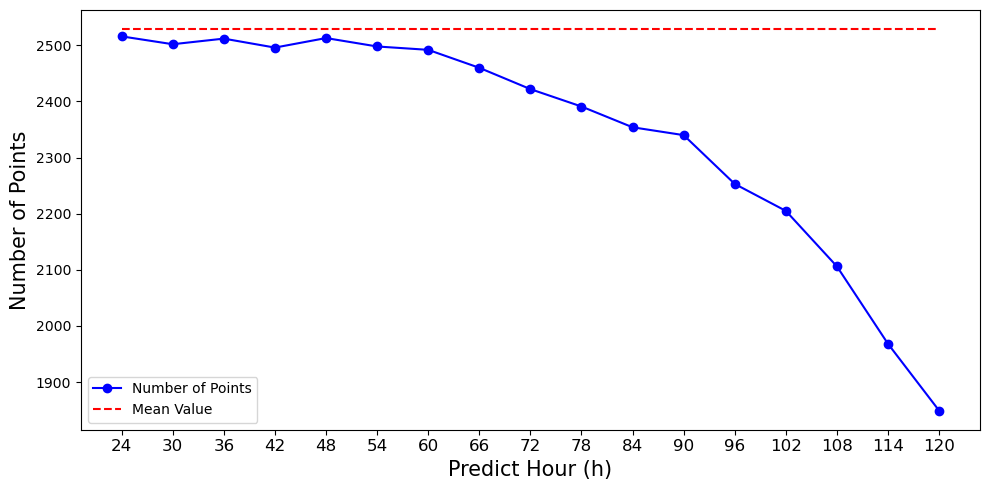

In [31]:
# num_list = []
# for t in time_array:

#     num_list.append(cov_timeline[t]['mid_pos_all'].shape[0])
#     # / cov_timeline[t]['group_idx_list'].shape[0]

# plt.figure(figsize=(10, 5))
# plt.plot(time_array, num_list, marker='o', color='blue', label='Number of Points')
# plt.xlabel('Predict Hour (h)', fontsize=15)


num_list = []
for t in time_array:
    num_list.append(cov_timeline[t]['group_idx_list'].shape[0])

plt.figure(figsize=(10, 5))
plt.plot(time_array, num_list, marker='o', color='blue', label='Number of Points')
plt.xlabel('Predict Hour (h)', fontsize=15)
plt.ylabel('Number of Points', fontsize=15)

# 예: 평균값을 수평선으로 그리고 싶을 때
plt.hlines(y=cov_timeline[t]['mid_pos_all'].shape[0], xmin=time_array[0], xmax=time_array[-1], color='red', linestyle='--', label='Mean Value')

plt.xticks(time_array, fontsize=12)
plt.legend(loc = 'lower left')
plt.tight_layout()
plt.show()